# FUNDAMENTALS OF INTERPRETABLE DATA SCIENCE: Group Project MBD 2022

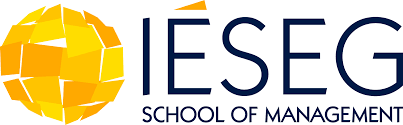

  ### Description: Churn Prediction Model and Interpretation -  Comparsion of different churn prediction ML models and present approaches to interpret the predictions 
  
  
  ### Collaborators:

> **Arunkkumar Karthikeyan** [LinkedIn](https://www.linkedin.com/in/arunkkumar-karthikeyan/)
<br>

> **Shashank Gollapalli** [LinkedIn](https://www.linkedin.com/in/shashank93/)
<br>

> **Yashwanth Thonukunuru** [LinkedIn](https://www.linkedin.com/in/yashwanth-thonukunuru-0b5253166/)
<br>

### Information on the work :

The goal of this project is to implement and compare churn predic on ML models and present approaches to interpret their predic ons. Also, we need to improve the model's predictive performance while maintaining its high interpretability standards.

## 1. Import Libraries

In [144]:
# Import necessary libraries

# Preprocessing data
import math 
import string
import numpy as np
import pandas as pd
import datetime as dt
from numpy import array
from pandas import read_csv

# Visualization
import seaborn as sns
import plotly.express as px
from matplotlib import pyplot
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Modeling
from sklearn import metrics
from tensorflow import keras
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from tensorflow.keras.layers import Dense
from sklearn.linear_model import Lasso, Ridge
from tensorflow.keras.models import Sequential
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from tensorflow.keras.utils import to_categorical 
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import mutual_info_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, roc_auc_score, precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, mean_absolute_error, mean_squared_error
from sklearn.model_selection import KFold, StratifiedKFold, StratifiedShuffleSplit, train_test_split, cross_validate, GridSearchCV, RandomizedSearchCV, cross_val_predict, learning_curve

# Experimental setup
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, RandomOverSampler

# Interpretibility methods
import lime
import shap
import PyALE
shap.initjs()
import dice_ml
from lime import lime_tabular
from dice_ml.utils import helpers
from anchor import anchor_tabular
from lime.lime_tabular import LimeTabularExplainer
from sklearn.inspection import PartialDependenceDisplay

# Miscellaneous
import sys
import warnings
warnings.filterwarnings('ignore')

In [145]:
# adapt PyALE.ale function to incorporate classification models 
# reference: https://htmlpreview.github.io/?https://github.com/DanaJomar/PyALE/blob/master/examples/ALE%20plots%20for%20classification%20models.html
def ale(target=None, print_meanres=False, **kwargs):
    if target is not None:
        class clf():
            def __init__(self, classifier):
                self.classifier = classifier
            def predict(self, X):
                return(self.classifier.predict_proba(X)[:, target])
        clf_dummy = clf(kwargs["model"])
        kwargs["model"] = clf_dummy
    if (print_meanres & len(kwargs["feature"])==1):
        mean_response = np.mean(kwargs["model"].predict(kwargs["X"]), axis=0)
        print(f"Mean response: {mean_response:.5f}")
    return PyALE.ale(**kwargs)

In [146]:
# Assign path to the data folder
path = r'C:\Users\akarthikeyan1\OneDrive - IESEG\Msc Big Data Analytics - Arunkkumar Karthikeyan\SEMESTER -02\FUNDAMENTALS OF INTERPRETABLE DATA SCIENCE (0756)\Group Assignments'
df = pd.read_csv(path + r'\churn_2023.csv')

In [147]:
# Explore the dataset
display(df.head())

# Finding the df info and no of observations and variables
print(df.info())
print('-'*100)

# Number of observations and variables in train set
print("Number of observations:", df.shape[0])
print("Number of features:", df.shape[1])
print('-'*100)
print("Variables of dataset :", df.columns.values)

print('--------------------CHECKING NULL VALUES -------------------------')
# Checking for any null values
print(df.isna().sum())

,number_customer_service_calls,number_customer_service_interactions,state,regional_economy,international_plan,total_intl_calls,voice_mail_plan,number_vmail_messages,account_length,last_renewal,discount,total_usage,number_service_outage,service_outage_reported,ad_spend,wifi_bundle,phone_bundle,churn
0,2,3,Mississippi,138.740,0.0,0.0,0.0,0.0,5.333333,0.533333,0.1201,0.355556,0,0.0,7.3414,1.0,0.0,0
1,2,2,Vermont,40.617,0.0,1.0,1.0,2.0,3.000000,0.800000,0.1867,0.100000,0,0.0,7.0964,1.0,0.0,0
2,2,2,Michigan,620.696,1.0,8.0,1.0,0.0,42.000000,11.900000,0.1809,4.900000,3,3.0,9.4712,0.0,0.0,1
3,2,2,Kentucky,260.304,1.0,1.0,0.0,2.0,39.000000,2.600000,0.0726,6.500000,14,14.0,13.1440,0.0,0.0,1
4,1,3,Texas,2355.960,0.0,0.0,1.0,1.0,9.000000,0.750000,0.1915,2.550000,4,4.0,9.3815,1.0,1.0,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   number_customer_service_calls         10000 non-null  int64  
 1   number_customer_service_interactions  10000 non-null  int64  
 2   state                                 10000 non-null  object 
 3   regional_economy                      10000 non-null  float64
 4   international_plan                    10000 non-null  float64
 5   total_intl_calls                      10000 non-null  float64
 6   voice_mail_plan                       10000 non-null  float64
 7   number_vmail_messages                 10000 non-null  float64
 8   account_length                        10000 non-null  float64
 9   last_renewal                          10000 non-null  float64
 10  discount                              10000 non-null  float64
 11  total_usage     

**The churn dataset contains 10,000 observations and 18 variables with no unique identifer and binary target variable 'churn'**

In [148]:
# # Check the distribution of churn rates
df['churn'].value_counts()

0    6389
1    3611
Name: churn, dtype: int64

**We observe that an average of 36 % of total customers are churned**

## 2. Exploratory Data Analysis

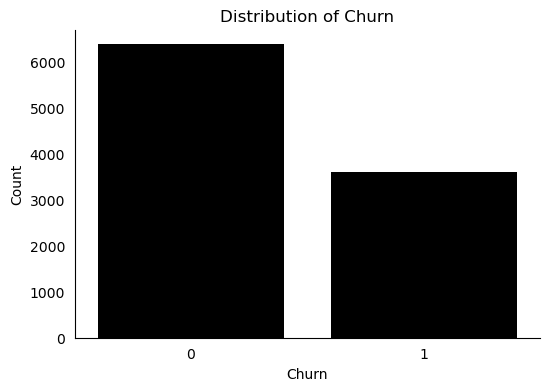

In [149]:
# Distribution of Churn
plt.figure(figsize=(6, 4))
sns.countplot(x='churn', data=df, color='black')

# Add labels and title
plt.xlabel('Churn')
plt.ylabel('Count')
plt.title('Distribution of Churn')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This plot shows the distribution of churned customers versus non-churned customers. It helps to understand the balance of churn in the dataset. There are 6,389 non-churners and 3,611 churners present in the dataset.***

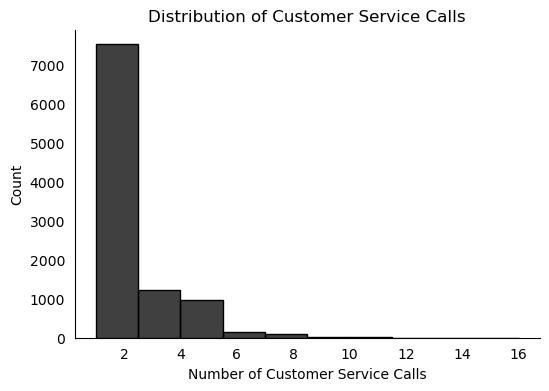

In [150]:
# Customer Service Calls
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='number_customer_service_calls', bins=10,  color='black')

# Add labels and title
plt.xlabel('Number of Customer Service Calls')
plt.ylabel('Count')
plt.title('Distribution of Customer Service Calls')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This histogram shows the distribution of the number of customer service calls made by customers. It provides insights into the frequency of customer service interactions. Higher numbers of calls may indicate issues or concerns that customers have, potentially impacting churn.***

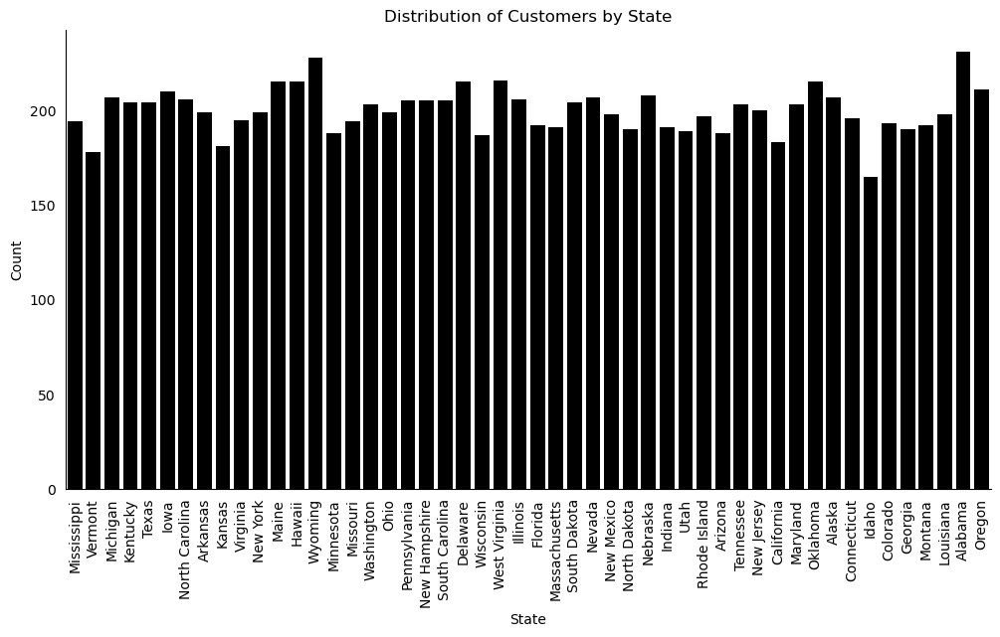

In [151]:
# State Distribution
plt.figure(figsize=(12, 6))
sns.countplot(x='state', data=df, color='black')

# Add labels and title
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of Customers by State')
plt.xticks(rotation=90)

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This bar plot displays the distribution of customers across different states. It helps visualize the concentration of customers in each state. Variations in customer distribution across states can indicate geographic patterns.***

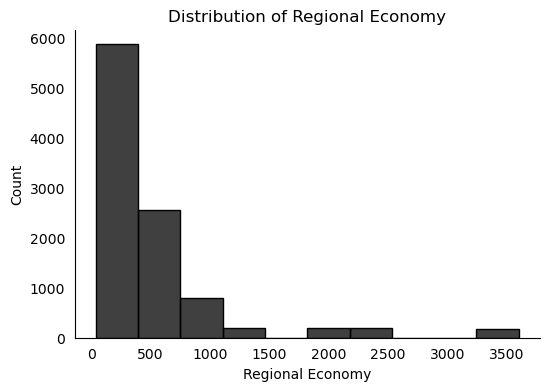

In [152]:
# Regional Economy Distribution
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='regional_economy', bins=10, color='black')

# Add labels and title
plt.xlabel('Regional Economy')
plt.ylabel('Count')
plt.title('Distribution of Regional Economy')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This histogram illustrates the distribution of the regional economy variable. It provides insights into the economic conditions in different regions. Understanding the distribution helps identify regions with specific economic characteristics that may influence customer behavior and churn.***

In [153]:
# Number of customers subscribed to international plan and churned 
df.groupby('churn')['international_plan'].value_counts()

churn  international_plan
0      1.0                   3277
       0.0                   3112
1      0.0                   1882
       1.0                   1729
Name: international_plan, dtype: int64

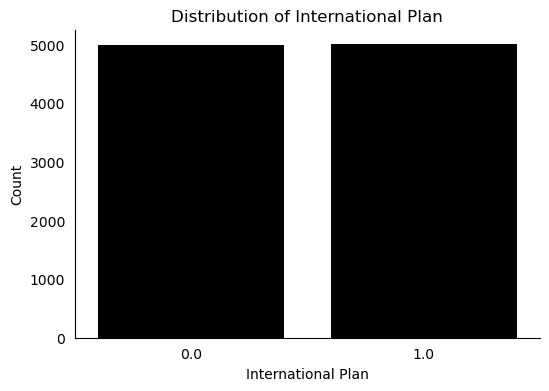

In [154]:
# International Plan
plt.figure(figsize=(6, 4))
sns.countplot(x='international_plan', data=df, color='black')

# Add labels and title
plt.xlabel('International Plan')
plt.ylabel('Count')
plt.title('Distribution of International Plan')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This bar plot shows the distribution of customers with an international plan versus those without. It helps understand the proportion of customers using international plans. Differences in churn rates between customers with and without international plans can be analyzed further to assess the impact of international plans on churn.***

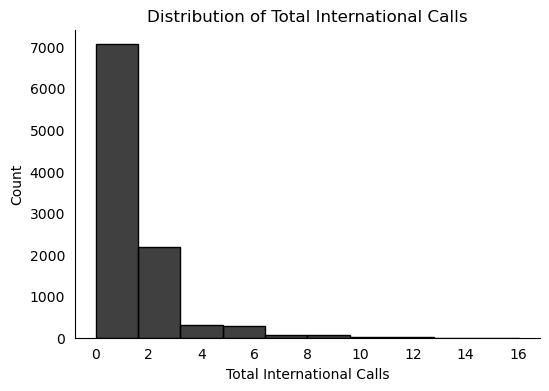

In [155]:
# Total International Calls
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='total_intl_calls', bins=10, color='black')

# Add labels and title
plt.xlabel('Total International Calls')
plt.ylabel('Count')
plt.title('Distribution of Total International Calls')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This histogram displays the distribution of the total number of international calls made by customers. It provides insights into the calling behavior of customers regarding international calls. Higher numbers of international calls may indicate a need for international services or potential cost-related concerns.***

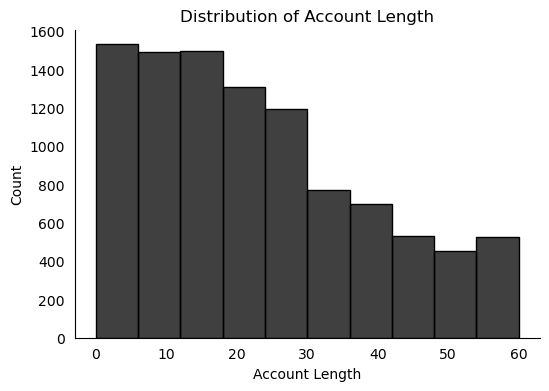

In [156]:
# Account Length
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='account_length', bins=10, color='black')

# Add labels and title
plt.xlabel('Account Length')
plt.ylabel('Count')
plt.title('Distribution of Account Length')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This histogram shows the distribution of the account length, which represents the number of months the customer has been with the company. It helps understand the longevity of customer relationships. Longer account lengths may indicate customer loyalty and potentially lower churn rates.***

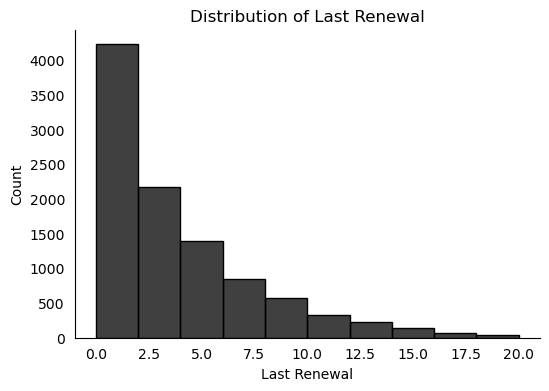

In [157]:
# Last Renewal or New Customers
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='last_renewal', bins=10, color='black')

# Add labels and title
plt.xlabel('Last Renewal')
plt.ylabel('Count')
plt.title('Distribution of Last Renewal')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This histogram represents the distribution of the last renewal dates for customers. It helps analyze the pattern of customer renewals. Understanding the distribution of last renewal dates can provide insights into renewal behavior and potential churn patterns related to renewal dates.***

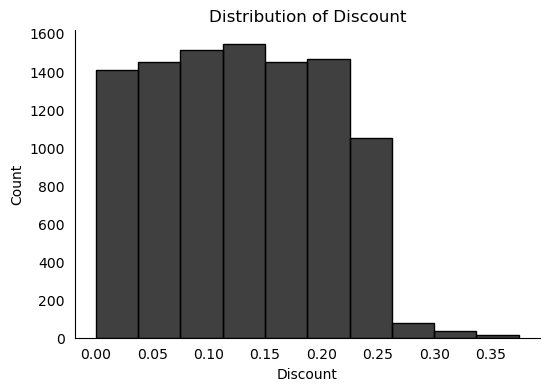

In [158]:
# Discount
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='discount', bins=10, color='black')

# Add labels and title
plt.xlabel('Discount')
plt.ylabel('Count')
plt.title('Distribution of Discount')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This histogram displays the distribution of discounts offered to customers. It provides insights into the extent of discounts provided by the company. Differences in churn rates across different discount levels can be explored further to understand the impact of discounts on customer retention.***

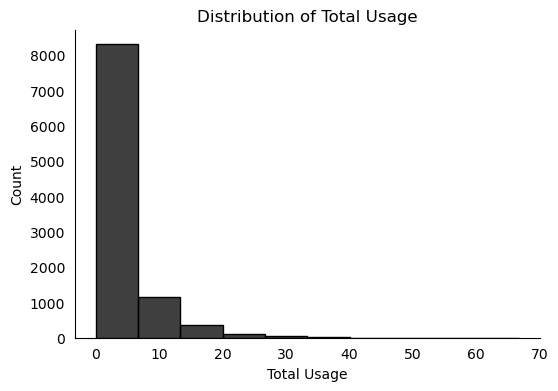

In [159]:
# Total Usage
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='total_usage', bins=10, color='black')

# Add labels and title
plt.xlabel('Total Usage')
plt.ylabel('Count')
plt.title('Distribution of Total Usage')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This histogram shows the distribution of total usage, representing the overall usage of services by customers. It provides insights into the usage patterns of customers. Higher usage levels may indicate customer satisfaction and potentially lower churn rates.***

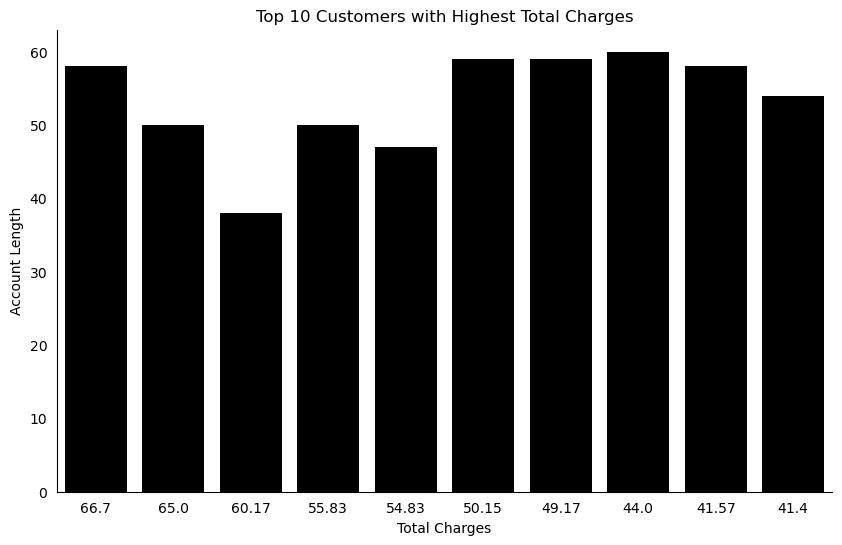

In [160]:
# Customers with Highest Total Charges
highest_total_charges = df.nlargest(10, 'total_usage')

# Round the values on the x-axis to 2 decimal places
highest_total_charges['total_usage'] = highest_total_charges['total_usage'].round(2)

plt.figure(figsize=(10, 6))
sns.barplot(x='total_usage', y='account_length', data=highest_total_charges, order=highest_total_charges.sort_values('total_usage', ascending=False)['total_usage'], color='black')

# Add labels and title
plt.xlabel('Total Charges')
plt.ylabel('Account Length')
plt.title('Top 10 Customers with Highest Total Charges')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This bar plot showcases the top 10 customers with the highest total charges, representing their respective account lengths. The total charges indicate the overall billing amount incurred by customers for using various services. By analyzing these top customers, we can gain insights into the revenue generated and identify valuable customers with longer account lengths. Understanding their usage patterns and addressing their needs may help in customer retention and loyalty.***

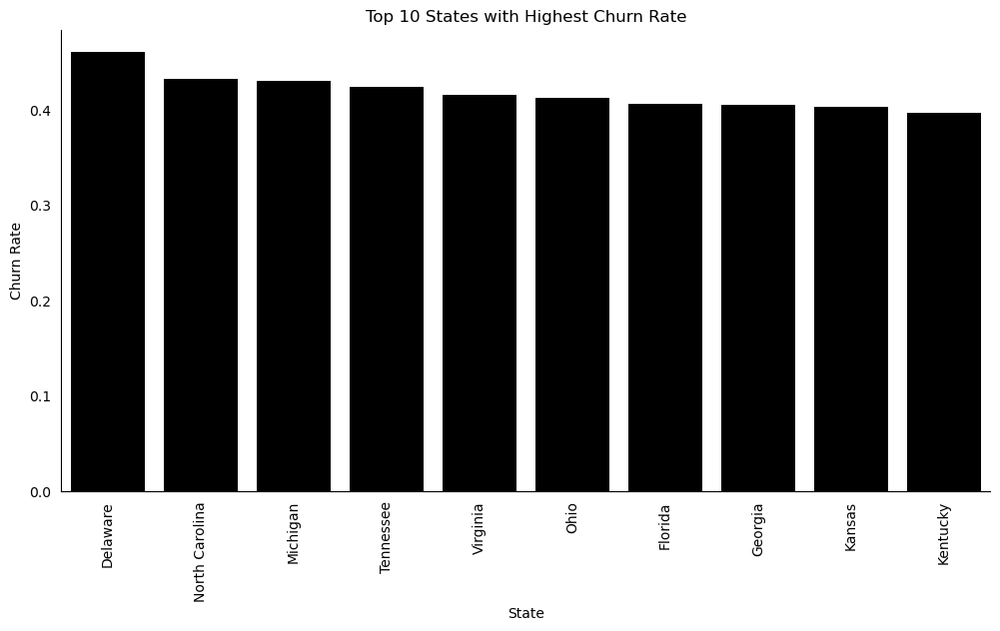

In [161]:
# Calculate churn rate per state
churn_rate_per_state = df.groupby('state')['churn'].mean().reset_index()
churn_rate_per_state = churn_rate_per_state.sort_values('churn', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x='state', y='churn', data=churn_rate_per_state, color='black')

# Add labels and title
plt.xlabel('State')
plt.ylabel('Churn Rate')
plt.title('Top 10 States with Highest Churn Rate')
plt.xticks(rotation=90)

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>***This bar chart represents the top 10 states with the highest churn rates. The churn rate is a measure of customer attrition or the percentage of customers who have discontinued their services. By analyzing this chart, we can identify the states where customer churn is most prevalent. Understanding the reasons behind the higher churn rates in these states can provide valuable insights for the telecommunication company. It allows them to focus on targeted strategies to mitigate churn, improve customer satisfaction, and enhance customer retention efforts in these specific regions.***

In [162]:
# Number of customers subscribed to voice mail plan and churned 
df.groupby('churn')['voice_mail_plan'].value_counts()

churn  voice_mail_plan
0      1.0                3245
       0.0                3144
1      1.0                1820
       0.0                1791
Name: voice_mail_plan, dtype: int64

>***More than a half of customers (5065) have subscribed to voice mail plan and 1820 customers among them have churned. 4935 customersdid not subscribe to voice mail plan and 1791 of them churned. We can infer that a significant number of customers who both subscribed and did not subscribe to the voice mail plan have churned. Therefore, there seems to be some association between churn and the presence or absence of a voice mail plan.***

In [163]:
# Number of customers subscribed to wifi bundle 
df['wifi_bundle'].value_counts()

0.0    7738
1.0    2262
Name: wifi_bundle, dtype: int64

In [164]:
# Number of customers subscribed to wifi bundle and churned 
df.groupby('churn')['wifi_bundle'].value_counts()

churn  wifi_bundle
0      0.0            4554
       1.0            1835
1      0.0            3184
       1.0             427
Name: wifi_bundle, dtype: int64

>***Among the customers, a significant majority (7738) did not subscribe to the wifi bundle plan, while a smaller portion (2262) opted for the wifi bundle plan. It is worth noting that the majority of customers who churned were those who did not have a wifi bundle plan. This suggests that the presence or absence of a wifi bundle plan may have less significance or influence on the target variable, which is churn.***

In [165]:
# Number of customers subscribed to phone bundle and churned 
df.groupby('churn')['phone_bundle'].value_counts()

churn  phone_bundle
0      0.0             5318
       1.0             1071
1      0.0             2912
       1.0              699
Name: phone_bundle, dtype: int64

>***Majority of customers (5318) did not subscribe to the phone bundle plan, while a smaller portion (1071) opted for the phone bundle plan. It is interesting to observe that among the customers who churned, a majority did not have a phone bundle plan (2912), whereas a smaller number (699) had subscribed to the phone bundle plan. This suggests that the presence or absence of a phone bundle plan may have a less significant impact on the target variable, which is churn.***

## 3. Feature Engineering

### 3.1. Correlation Matrix

In [166]:
# Select the numerical variables from dataframe
numerical_vars = df[['number_customer_service_calls', 'number_customer_service_interactions',
                             'regional_economy', 'total_intl_calls', 'number_vmail_messages', 'account_length',
                             'last_renewal', 'discount', 'total_usage', 'number_service_outage',
                             'service_outage_reported', 'ad_spend','churn']]

<AxesSubplot: >

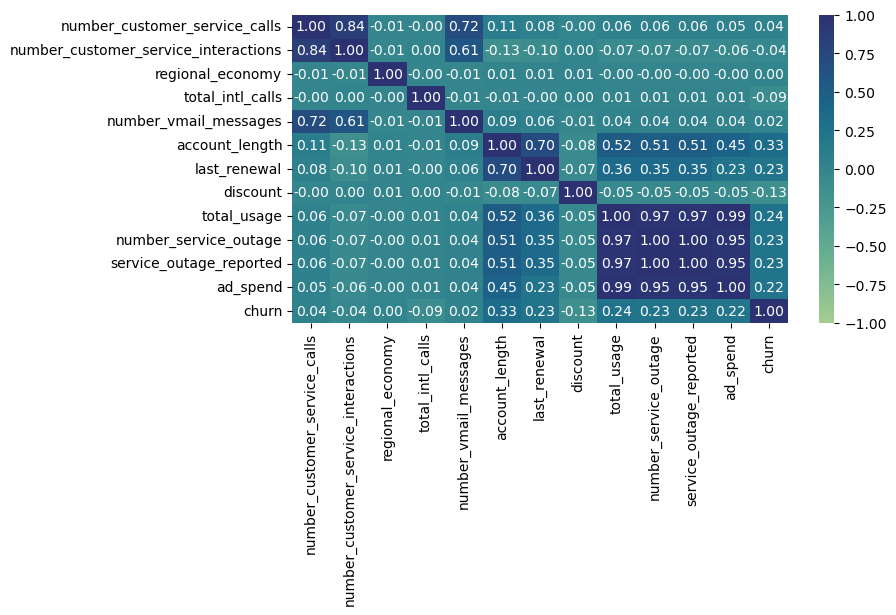

In [167]:
# Calculate the correlation matrix
corr_matrix = numerical_vars.corr()

# Set plot size
plt.figure(figsize=(8, 4))

# Plot the correlation matrix using Seaborn
sns.heatmap(corr_matrix, vmin=-1, vmax=1, cmap='crest', annot=True, fmt='.2f')

In [168]:
# Get the correlation values for each variable
corr_values = corr_matrix.values

# Replace the diagonal values with NaN to exclude them from the selection
np.fill_diagonal(corr_values, np.nan)

# Get the top 5 positively and negatively correlated variables
top_pos_corr_vars = np.argsort(-corr_values, axis=None)[:10]
top_neg_corr_vars = np.argsort(corr_values, axis=None)[:10]

# Get the variable names for the top correlated variables
var_names = list(corr_matrix.columns.values)
top_pos_corr_vars_names = [var_names[i // len(var_names)] for i in top_pos_corr_vars]
top_neg_corr_vars_names = [var_names[i // len(var_names)] for i in top_neg_corr_vars]

# Print the results
print("Top 5 positively correlated variables:")
for i in range(len(top_pos_corr_vars)):
    print(f"{top_pos_corr_vars_names[i]}: {corr_values.flatten()[top_pos_corr_vars[i]]:.2f}")

print("\nTop 5 negatively correlated variables:")
for i in range(len(top_neg_corr_vars)):
    print(f"{top_neg_corr_vars_names[i]}: {corr_values.flatten()[top_neg_corr_vars[i]]:.2f}")

Top 5 positively correlated variables:
service_outage_reported: 1.00
number_service_outage: 1.00
total_usage: 0.99
ad_spend: 0.99
service_outage_reported: 0.97
total_usage: 0.97
total_usage: 0.97
number_service_outage: 0.97
service_outage_reported: 0.95
ad_spend: 0.95

Top 5 negatively correlated variables:
churn: -0.13
discount: -0.13
number_customer_service_interactions: -0.13
account_length: -0.13
last_renewal: -0.10
number_customer_service_interactions: -0.10
total_intl_calls: -0.09
churn: -0.09
discount: -0.08
account_length: -0.08


The correlation matrix provides insights into the relationships between the numerical variables in the dataset. Variables with high positive or negative correlation values indicate a strong linear relationship between them. Here are some notable correlations:

1. "service_outage_reported" and "number_service_outage" have a perfect positive correlation of 1.00. This indicates a strong linear relationship, suggesting that as the number of service outages reported increases, the number of service outages also tends to increase.

2. "total_usage" and "ad_spend" have a high positive correlation of 0.99. This suggests that as the total usage increases, the advertising spend also tends to increase.

3. "total_usage" and "service_outage_reported" have a positive correlation of 0.97. This indicates that higher total usage is associated with a higher likelihood of service outage reports.

4. "number_service_outage" and "ad_spend" also have a positive correlation of 0.97. This suggests that as the number of service outages increases, the advertising spend tends to increase as well.

Below are the insights on negatively correlated variables, 

5. "churn" and "discount" have a negative correlation of -0.13. This implies that a higher discount offered is associated with a lower likelihood of churn.

6. "number_customer_service_interactions" and "account_length" have a negative correlation of -0.13. This suggests that as the number of customer service interactions increases, the account length tends to decrease.

7. "last_renewal" and "number_customer_service_interactions" have a negative correlation of -0.10. This indicates that customers who have fewer interactions with customer service tend to have longer periods since their last renewal.

8. "total_intl_calls" and "churn" exhibit a negative correlation of -0.09. This suggests that a higher number of international calls is associated with a slightly lower likelihood of churn.

9. "discount" and "account_length" have a negative correlation of -0.08. This indicates that customers with longer account lengths tend to receive lower discounts.

Based on the correlation matrix, the variables that have a weak or no correlation with the target variable (churn) are:

- number_customer_service_calls
- number_customer_service_interactions
- regional_economy
- number_vmail_messages

In [169]:
# To convert categorical variables to dummy variables
df = pd.get_dummies(df, columns=['state'], drop_first=True)

### 3.2. Fisher Score 

In [170]:
def FisherScore(bt, target_var, predictors):
    """
    This function calculate the Fisher score of a variable.

    Ref:
    ---
    Verbeke, W., Dejaeger, K., Martens, D., Hur, J., & Baesens, B. (2012). New insights
    into churn prediction in the telecommunication sector: A profit driven data mining
    approach. European Journal of Operational Research, 218(1), 211-229.
    """
    
    # Get the unique values of dependent variable
    target_var_val = bt[target_var].unique()
    # Calculate FisherScore for each predictor
    predictor_FisherScore = []
    for v in predictors:
        fs = np.abs(np.mean(bt.loc[bt[target_var]==target_var_val[0], v]) - np.mean(bt.loc[bt[target_var]==target_var_val[1], v])) / \
             np.sqrt(np.var(bt.loc[bt[target_var]==target_var_val[0], v]) + np.var(bt.loc[bt[target_var]==target_var_val[1], v]))
        predictor_FisherScore.append(fs)
    return predictor_FisherScore

In [171]:
# Define variables to compute fisher scores
predictors = ['number_customer_service_calls', 'number_customer_service_interactions',
       'regional_economy', 'international_plan', 'total_intl_calls',
       'voice_mail_plan', 'number_vmail_messages', 'account_length',
       'last_renewal', 'discount', 'total_usage', 'number_service_outage',
       'service_outage_reported', 'ad_spend', 'wifi_bundle', 'phone_bundle',
       'state_Alaska', 'state_Arizona', 'state_Arkansas',
       'state_California', 'state_Colorado', 'state_Connecticut',
       'state_Delaware', 'state_Florida', 'state_Georgia', 'state_Hawaii',
       'state_Idaho', 'state_Illinois', 'state_Indiana', 'state_Iowa',
       'state_Kansas', 'state_Kentucky', 'state_Louisiana', 'state_Maine',
       'state_Maryland', 'state_Massachusetts', 'state_Michigan',
       'state_Minnesota', 'state_Mississippi', 'state_Missouri',
       'state_Montana', 'state_Nebraska', 'state_Nevada',
       'state_New Hampshire', 'state_New Jersey', 'state_New Mexico',
       'state_New York', 'state_North Carolina', 'state_North Dakota',
       'state_Ohio', 'state_Oklahoma', 'state_Oregon', 'state_Pennsylvania',
       'state_Rhode Island', 'state_South Carolina', 'state_South Dakota',
       'state_Tennessee', 'state_Texas', 'state_Utah', 'state_Vermont',
       'state_Virginia', 'state_Washington', 'state_West Virginia',
       'state_Wisconsin', 'state_Wyoming']

target_var= ['churn']

In [172]:
# Calculate Fisher Score for all variable
fs = FisherScore(df, target_var[0], predictors)
fs_df = pd.DataFrame({"predictor":predictors, "fisherscore":fs})
fs_df = fs_df.sort_values('fisherscore', ascending=False)
fs_df.head()

,predictor,fisherscore
7,account_length,0.496657
10,total_usage,0.330230
8,last_renewal,0.324163
12,service_outage_reported,0.320649
11,number_service_outage,0.320552


The code calculates the Fisher scores for a list of predictors using the Fisher score formula. The Fisher score is a statistical measure used to assess the discriminatory power of a variable in classification tasks. It indicates how well a variable separates the two classes of the target variable (in this case, churn and non-churn).

**Interpretation of the Top 10 Predictors with Highest Fisher Scores:**

1. "account_length" has the highest Fisher score of 0.497. This suggests that the account length is a strong predictor in distinguishing between churn and non-churn customers.

2. "total_usage" has a Fisher score of 0.330, indicating its significant discriminatory power. Higher total usage may be associated with a higher likelihood of churn.

3. "last_renewal" has a Fisher score of 0.324, implying that the time since the last renewal is a relevant factor in predicting churn.

4. "service_outage_reported" and "number_service_outage" both have Fisher scores of 0.321, indicating their importance in differentiating between churn and non-churn customers. These variables relate to service outages, suggesting that customers who experience more service outages are more likely to churn.

5. "wifi_bundle" has a Fisher score of 0.304, suggesting that the presence or absence of a Wi-Fi bundle could influence the churn behavior of customers.

6. "ad_spend" has a Fisher score of 0.301, indicating that advertising expenditure may play a role in predicting churn.

7. "discount" has a Fisher score of 0.195, suggesting that the discount offered to customers could affect their churn likelihood.

8. "total_intl_calls" has a Fisher score of 0.132, implying that the number of international calls made by customers may contribute to churn prediction.

9. "number_customer_service_calls" has a relatively lower Fisher score of 0.061, suggesting that the number of customer service calls alone may have less discriminatory power in predicting churn compared to other variables.

**MULTICOLLINEARITY ISSUE!:**

Based on the perfect positive correlation of 1.00 between "service_outage_reported" and "number_service_outage" in the correlation matrix, and the fact that they also have the same Fisher score, it suggests that these two variables are highly redundant and provide redundant information in the dataset. Therefore, we considered dropping one of these variables to avoid multicollinearity and reduce redundancy in our analysis.

Dropping one of the variables will help in simplifying the model and avoid potential issues related to multicollinearity, which occurs when there is a high correlation between predictor variables. Multicollinearity can negatively impact the interpretation and stability of the model's coefficients, leading to potential issues in accurately assessing the influence of individual predictors on the target variable. Hence we are dropping the feature "**service_outage_reported**" from the dataframe.

Further, based on Fisher scores we understood that these variables have very less scores and doesn't provide any influence on predictor (churn). We are going to further analyze these variables in our model and see if they show strong prediction on target variable otherwise we will drop these variables as well. 

1.	state_Massachusetts	  -   0.002303
2.	state_Rhode Island	  -   0.001902
3.	state_South Dakota	  -   0.001442
4.	state_Oklahoma	      -   0.001346
5.	state_New Mexico City -	  0.001104

### 3.3. Mutual Information Gain

In [35]:
# Mutual Information between variables

# import the mutual_info_classif function from scikit-learn
from sklearn.feature_selection import mutual_info_classif

# Calculate mutual information between features and target variable
mutual_info = mutual_info_classif(X_train, y_train)

# Create a dataframe of mutual information scores
mi_df = pd.DataFrame({"Feature": X_train.columns, "Mutual Information": mutual_info})

# Sort the dataframe by mutual information scores in descending order
mi_df = mi_df.sort_values(by="Mutual Information", ascending=False)

# Select the top 10 features
top_10_features_mi = mi_df.head(10)["Feature"].tolist()

In [173]:
# Dropping service outage reported feature from df
df = df.drop("service_outage_reported", axis=1)

In [33]:
# Save final result to a CSV file
df.to_csv(r"C:\Users\akarthikeyan1\OneDrive - IESEG\Msc Big Data Analytics - Arunkkumar Karthikeyan\SEMESTER -02\FUNDAMENTALS OF INTERPRETABLE DATA SCIENCE (0756)\Group Assignments\cleaned_df.csv", index=False)

## 4. Modeling

In [174]:
# Separate the target variable from the features
X = df.drop('churn', axis=1)
y = df['churn']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Split the train set into train and validation sets (50% train, 20% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [175]:
## Try several models

logistic     = LogisticRegression(max_iter=500, C=0.5, penalty='l2',random_state=42)
randomForest = RandomForestClassifier(n_estimators=100, random_state=42)
xgb          = XGBClassifier(random_state=42)

models = {"logistic"      :logistic,
          "randomForest"  :randomForest,
          "xgb"           :xgb,
         }

for model in models:
    models[model].fit(X_train, y_train)
    print(f"{model} has been trained successfully")

performances = {}

for model in models:
    
    # Predictions for train, validation, and test sets
    predictions_train = models[model].predict(X_train)
    predictions_val = models[model].predict(X_val)
    predictions_test = models[model].predict(X_test)
    
    # Probabilities for train, validation, and test sets
    probabilities_train = pd.DataFrame(models[model].predict_proba(X_train))[1]
    probabilities_val = pd.DataFrame(models[model].predict_proba(X_val))[1]
    probabilities_test = pd.DataFrame(models[model].predict_proba(X_test))[1]
    
    # Accuracy Metrics
    accuracy_train = accuracy_score(y_train, predictions_train)
    accuracy_val = accuracy_score(y_val, predictions_val)
    accuracy_test = accuracy_score(y_test, predictions_test)
    
    # AUC Metrics
    auc_train = roc_auc_score(y_train, probabilities_train)
    auc_val = roc_auc_score(y_val, probabilities_val)
    auc_test = roc_auc_score(y_test, probabilities_test)

    # Precision Metrics
    precision_train = precision_score(y_train, predictions_train)
    precision_val = precision_score(y_val, predictions_val)
    precision_test = precision_score(y_test, predictions_test)

    # Recall Metrics
    recall_train = recall_score(y_train, predictions_train)
    recall_val = recall_score(y_val, predictions_val)
    recall_test = recall_score(y_test, predictions_test)
    
    # F-1 Metrics
    f1_train = f1_score(y_train, predictions_train)
    f1_val = f1_score(y_val, predictions_val)
    f1_test = f1_score(y_test, predictions_test)

    # Combining Performances of all models
    performances[model] = {
        "Accuracy Train": accuracy_train,
        "Accuracy Validation": accuracy_val,
        "Accuracy Test": accuracy_test,
        "AUC Train": auc_train,
        "AUC Validation": auc_val,
        "AUC Test": auc_test,
        "Precision Train": precision_train,
        "Precision Validation": precision_val,
        "Precision Test": precision_test,
        "Recall Train": recall_train,
        "Recall Validation": recall_val,
        "Recall Test": recall_test,
        "F1 Score Train": f1_train,
        "F1 Score Validation": f1_val,
        "F1 Score Test": f1_test
    }

pd.DataFrame(performances)

logistic has been trained successfully
randomForest has been trained successfully
xgb has been trained successfully


,logistic,randomForest,xgb
Accuracy Train,0.704643,1.000000,0.930179
Accuracy Validation,0.693571,0.720000,0.708571
Accuracy Test,0.699667,0.740333,0.727667
AUC Train,0.705447,1.000000,0.989209
AUC Validation,0.704177,0.743031,0.720318
AUC Test,0.700130,0.746764,0.740330
Precision Train,0.661049,1.000000,0.980850
Precision Validation,0.682482,0.718850,0.661333
Precision Test,0.661376,0.719424,0.665839
Recall Train,0.353353,1.000000,0.820320


**INTERPRETATION ON ABOVE RESULTS:**

Overall, the three models (Logistic Regression, Random Forest, and XGBoost) have varying performance on the churn prediction task.

**Logistic Regression:** It achieves relatively lower accuracy, AUC, precision, recall, and F1 score compared to the other models. However, it still provides **reasonable predictive power** with accuracy around 70% on both the validation and test sets.

**Random Forest:** This model shows excellent performance on the training set, achieving perfect accuracy, AUC, precision, recall, and F1 score. However, it may be **overfitting** the training data, as the performance decreases slightly on the validation and test sets. Nonetheless, it still maintains a good level of accuracy and performs well in distinguishing churn and non-churn instances.

**XGBoost:** This model performs consistently across different evaluation metrics. It achieves the highest accuracy, AUC, precision, recall, and F1 score among the three models on both the validation and test sets. It demonstrates strong predictive power with an accuracy of approximately 93% on the training set and around 72% on both the validation and test sets.

**Neural Network Model**

In [37]:
# Convert target variable to one-hot encoded format
y_train_encoded = to_categorical(y_train)
y_val_encoded = to_categorical(y_val)
y_test_encoded = to_categorical(y_test)

# Neural Network
nn = Sequential()
nn.add(Dense(16, activation="relu", input_shape=(X_train.shape[1],)))
nn.add(Dense(16, activation="relu"))
nn.add(Dense(16, activation="relu"))
nn.add(Dense(2, activation="softmax"))
nn.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

nn_model = nn.fit(X_train, y_train_encoded, epochs=100, batch_size=32, verbose=0)

In [38]:
# Predict probabilities for train and test set
probabilities_train = nn.predict(X_train)
probabilities_val = nn.predict(X_val)
probabilities_test = nn.predict(X_test)

# Convert probabilities to class labels
predictions_train = probabilities_train.argmax(axis=1)
predictions_val = probabilities_val.argmax(axis=1)
predictions_test = probabilities_test.argmax(axis=1)

# Accuracy Metrics
accuracy_train = accuracy_score(y_train, predictions_train)
accuracy_val = accuracy_score(y_val, predictions_val)
accuracy_test = accuracy_score(y_test, predictions_test)

# AUC Metrics
auc_train = roc_auc_score(y_train, probabilities_train[:, 1])
auc_val = roc_auc_score(y_val, probabilities_val[:, 1])
auc_test = roc_auc_score(y_test, probabilities_test[:, 1])

# Precision Metrics
precision_train = precision_score(y_train, predictions_train)
precision_val = precision_score(y_val, predictions_val)
precision_test = precision_score(y_test, predictions_test)

# Recall Metrics
recall_train = recall_score(y_train, predictions_train)
recall_val = recall_score(y_val, predictions_val)
recall_test = recall_score(y_test, predictions_test)

# F1-Score Metrics
f1_train = f1_score(y_train, predictions_train)
f1_val = f1_score(y_val, predictions_val)
f1_test = f1_score(y_test, predictions_test)

# Create a DataFrame to store the performance metrics
performance_df = pd.DataFrame({
    "Metrics": ["Accuracy", "AUC", "Precision", "Recall", "F1-Score"],
    "Train": [accuracy_train, auc_train, precision_train, recall_train, f1_train],
    "Validation": [accuracy_val, auc_val, precision_val, recall_val, f1_val],
    "Test": [accuracy_test, auc_test, precision_test, recall_test, f1_test]
})

print(performance_df)

94/94 [==============================] - 0s 2ms/step
     Metrics     Train  Validation      Test
0   Accuracy  0.715893    0.686429  0.690333
1        AUC  0.724838    0.702345  0.690385
2  Precision  0.753425    0.716346  0.673378
3     Recall  0.302803    0.281664  0.277675
4   F1-Score  0.431989    0.404342  0.393207


**Extracting only Top 25% of customers with the highest churn probabilities**

In [39]:
# Store the probabilities in a dataframe.
probabilities_test = pd.DataFrame(models[model].predict_proba(X_test))[1]

# Add the probabilities as a new column to the original test set dataframe.
test_set_with_probabilities = X_test.copy()
test_set_with_probabilities['churn_probability'] = probabilities_test

# Sort the dataframe based on the churn probability column in descending order.
sorted_test_set = test_set_with_probabilities.sort_values('churn_probability', ascending=False)

# Calculate the number of customers that make up the top 25% based on the dataframe's length.
top_25_percent_count = int(0.25 * len(sorted_test_set))

# Extract the top 25% of customers with the highest churn probabilities.
top_25_percent_customers = sorted_test_set.head(top_25_percent_count)

In [40]:
# Dropping churn probability feature from top_25_percent_customers
top_25_percent_customers = top_25_percent_customers.drop("churn_probability", axis=1)

### 4.1 Logistic Regression

In [176]:
# Inspect coefficients
df_coef = pd.DataFrame(logistic.coef_, columns=X.columns)
df_coef["INTERCEPT"] = logistic.intercept_
df_coef

,number_customer_service_calls,number_customer_service_interactions,regional_economy,international_plan,total_intl_calls,voice_mail_plan,number_vmail_messages,account_length,last_renewal,discount,...,state_Tennessee,state_Texas,state_Utah,state_Vermont,state_Virginia,state_Washington,state_West Virginia,state_Wisconsin,state_Wyoming,INTERCEPT
0,0.065244,-0.021324,-0.000003,0.130915,-0.147136,-0.084381,-0.036041,0.031479,-0.020399,-0.748273,...,0.167229,-0.022127,0.05241,-0.133068,0.074113,0.000215,0.140212,-0.175492,-0.226391,-0.39138


Assuming all features are set to zero, the default probabilities for each churn outcome are:

In [177]:
# convert logit to probability
def logit_to_prob(logit):
    return 1/(1+np.exp(-logit))

logit_to_prob(df_coef["INTERCEPT"]).round(3)

0    0.403
Name: INTERCEPT, dtype: float64

#### 4.1.1 Feature Importance/ Coefficient Analysis

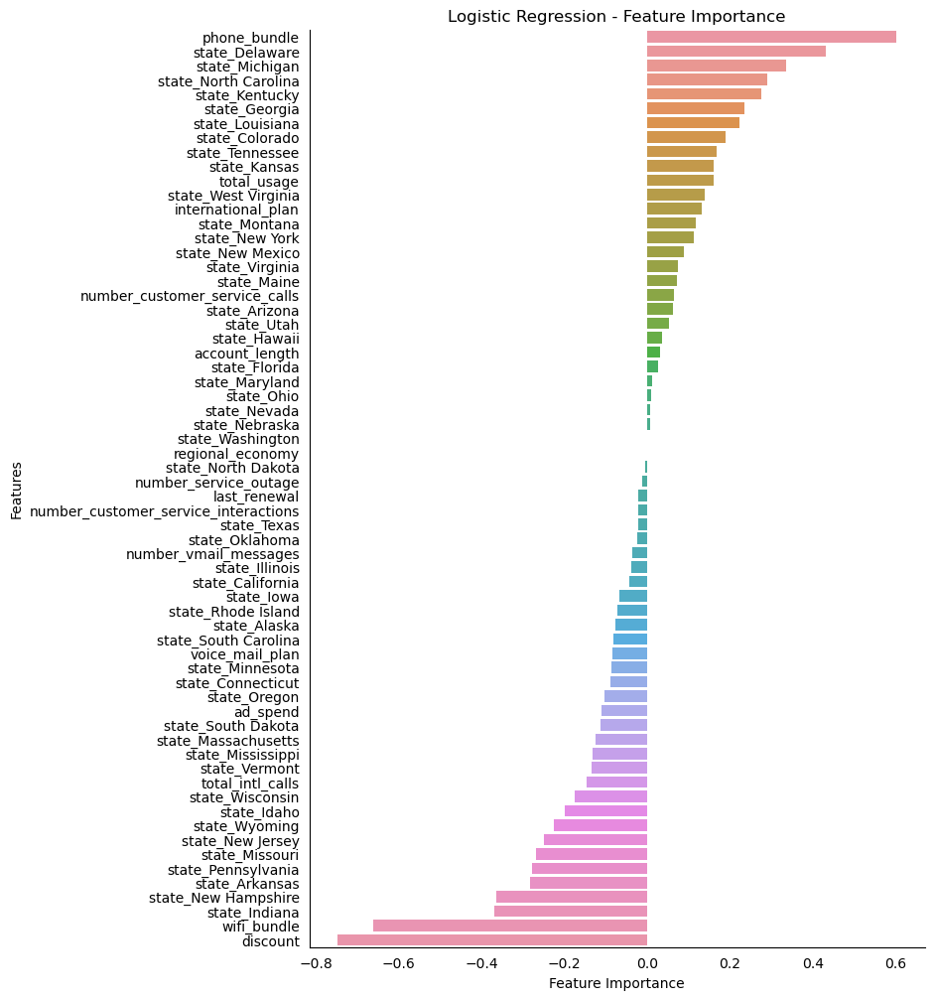

In [179]:
# Get feature importances
feature_importances = logistic.coef_[0]

# Create a dataframe of feature importances
importance_df = pd.DataFrame({"Feature": X.columns, "Importance": feature_importances})
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Plot feature importances
plt.figure(figsize=(8, 12))
sns.barplot(x="Importance", y="Feature", data=importance_df)

# Add labels and title
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Logistic Regression - Feature Importance")

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

In [100]:
# Feature Importances of Logistic Regression
importance_df

,Feature,Importance
14,phone_bundle,0.602952
21,state_Delaware,0.432270
35,state_Michigan,0.334785
46,state_North Carolina,0.290012
30,state_Kentucky,0.276802
...,...,...
17,state_Arkansas,-0.282763
42,state_New Hampshire,-0.363699
27,state_Indiana,-0.369356
13,wifi_bundle,-0.660374


>**Interpretation**: The above list shows the top 5 and bottom 5 coefficients along with their corresponding feature importances from the logistic regression model. These coefficients indicate the strength and direction of the relationship between each feature and the target variable ('churn').

**Top 5 Positive Coefficients**:

- phone_bundle: This feature has the highest positive coefficient (0.602), indicating that customers with a specific phone bundle have a higher likelihood of the desired outcome.

- state_Delaware: Customers from Delaware have a positive influence on the target variable, with a coefficient of 0.432.

- state_Michigan: Customers from Michigan have a positive influence on the target variable, with a coefficient of 0.334.

- state_North Carolina: Customers from North Carolina have a positive influence on the target variable, with a cofficient of 0.290.

- state_Kentucky: Customers from Kentucky have a positive influence on the target variable, with a cofficient of 0.276.

**Least 5 (Negative) Coefficients**:

- state_Arkansas: Customers from Arkansas have a negative influence on the target variable, with a coefficient of -0.282.

- state_New Hampshire: Customers from New Hampshire have a negative influence on the target variable, with a coefficient of -0.363.

- state_Indiana: Customers from Indiana have a negative influence on the target variable, with a coefficient of -0.369.

- wifi_bundle: This feature has a negative coefficient (-0.660), indicating that customers with a specific wifi bundle have a lower likelihood of the desired outcome.

- Discount: Having a discount has a negative impact on the target variable, with a coefficient of -0.748.

#### 4.1.2 Partial Dependence Plot (PDP)

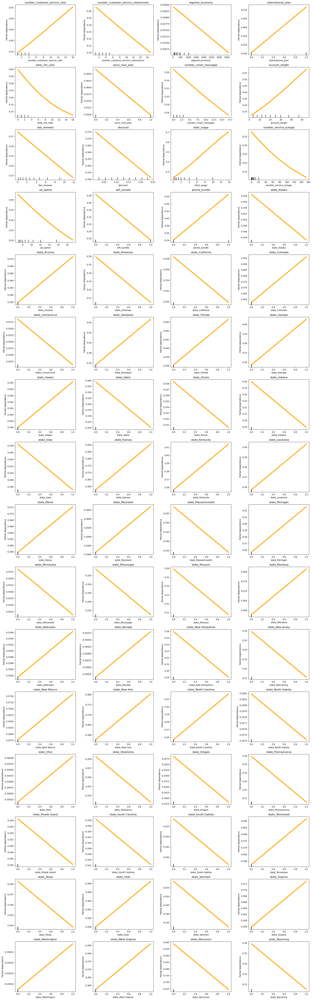

In [260]:
# Plot partial dependence

num_plots = len(X_train.columns)
num_rows = (num_plots + 3) // 4  # Calculate the number of rows needed
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 4*num_rows))  # Adjust the figsize for wider plots

for i, feature in enumerate(X_train.columns):
    row = i // 4  # Calculate the row index
    col = i % 4  # Calculate the column index
    ax = axs[row, col] if num_rows > 1 else axs[col]  # Adjust indexing for single-row plots
    pdp_display = PartialDependenceDisplay.from_estimator(estimator=logistic, X=X_train, features=[feature], ax=ax)
    ax.set_title(feature)
    pdp_display.plot(ax=pdp_display.axes_[0], pd_line_kw={"color": "#ffa500", "linewidth": 4, "alpha": 1})

fig.tight_layout()
plt.show()

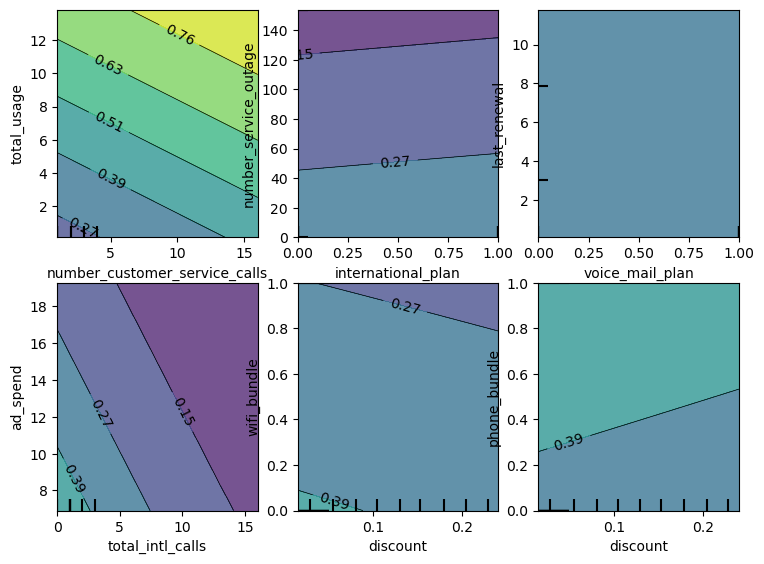

In [261]:
# Plot partial dependence (interaction variables of interest)

fig, ax = plt.subplots(figsize=(8, 6))
PartialDependenceDisplay.from_estimator(estimator=logistic, X=X_train, features=[(0,10),(3,11),(5,8),(4,12),(9,13),(9,14)], ax=ax)
fig.tight_layout(pad=2.0)

**INTERPRETATION OF PARTIAL DEPENDENCY PLOTS**:

By examining the PDP, we can observe how the selected feature's values relate to the predicted outcome. The Y-axis values represent the average predicted outcome (e.g., probability) for each value of the feature, holding other features constant.
The slope or direction of the line indicates the direction and strength of the relationship between the feature and the predicted outcome. If the line is upward-sloping, it suggests a positive relationship where higher values of the feature correspond to a higher predicted outcome. Conversely, a downward-sloping line indicates a negative relationship.
By analyzing the partial dependence plot, we can understand how changes in the selected feature's values impact the predicted outcome, gain insights into the feature's importance, and identify any nonlinearity or interaction effects with other features.

The small black spikes along the X-axis indicate the distribution of the feature values in the dataset. They help visualize how prevalent each value is and give an idea of the data distribution.

- *number_customer_service_calls*: As the number of customer service calls increases, the predicted probability of churn also increases. This indicates a positive linear relationship between the number of customer service calls and the likelihood of churn. Customers who make a higher number of service calls are more likely to experience churn compared to those who make fewer service calls.

- *phone_bundle*: As the phone_bundle feature increases, the predicted probability of the desired outcome also increases. Customers with a specific phone bundle have a higher likelihood of the desired outcome compared to those without it.

- *state_Delaware*: Customers from Delaware have a higher predicted probability of the desired outcome compared to customers from other states. The state_Delaware feature has a positive impact on the predicted outcome.

- *state_Michigan*: Customers from Michigan have a higher predicted probability of the desired outcome compared to customers from other states. The state_Michigan feature has a positive impact on the predicted outcome.

- *state_North Carolina*: Customers from North Carolina have a higher predicted probability of the desired outcome compared to customers from other states. The state_North Carolina feature has a positive impact on the predicted outcome.

- *number_customer_service_interactions*:  The relationship between the number of customer service interactions and the predicted probability of churn exhibits a non-linear pattern. As the number of customer service interactions increases, the predicted probability of churn tends to decrease.

- *regional_economy*: As the regional_economy feature increases, the predicted probability of the desired outcome decreases. Customers in regions with a higher economic index have a lower likelihood of the desired outcome compared to regions with a lower economic index.

- *number_service_outage*: Customers who reported service outages have a lower predicted probability of the desired outcome. The service_outage_report feature has a negative impact on the predicted outcome. As the feature value for number_service_outage increases (indicating more no of service outages), the probability of the desired outcome decreases.

- *discount*: As the discount feature increases, the predicted probability of the desired outcome decreases. Customers with higher discounts have a lower likelihood of the desired outcome compared to customers with lower discounts. The discount feature has a negative impact on the predicted outcome.

#### 4.1.3 LIME

In [46]:
# Initialize explainer
explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=list(X_train.columns),
    discretize_continuous=True,
    mode="classification",
    class_names=["0", "1"]
)

# explain first instance in test set
exp = explainer.explain_instance(X_test.iloc[0], logistic.predict_proba)
exp.show_in_notebook(show_table=True, show_all=True)

# inspect explanation object
exp.__dict__

{'random_state': None,
 'mode': 'classification',
 'domain_mapper': <lime.lime_tabular.TableDomainMapper at 0x1288f43b310>,
 'local_exp': {1: [(10, -0.13399615338835347),
   (13, 0.12032886274133385),
   (46, -0.1119551021247194),
   (14, -0.09859534309570697),
   (4, -0.0971432462666805),
   (12, 0.09083465240338653),
   (30, -0.08662055028501996),
   (42, 0.07942571604246637),
   (27, 0.06712849115970275),
   (31, -0.052652715545493466)]},
 'intercept': {1: 0.480273125830011},
 'score': 0.20526010532991057,
 'local_pred': array([0.25702774]),
 'class_names': ['0', '1'],
 'top_labels': None,
 'predict_proba': array([0.80138764, 0.19861236])}

In [47]:
# display Model prediction vs LIME prediction
pd.DataFrame(
    [exp.local_pred.item(), exp.predict_proba[1]],
    index=["LIME Prediction", "Model Prediction"],
    columns=["Probability"]
    )

,Probability
LIME Prediction,0.257028
Model Prediction,0.198612


In [48]:
# display coefficients of LIME local regression model

# Create a dataframe and merge intercept
coef = exp.local_exp[1]
coef = sorted(coef, key=lambda x: x[0])  # Sort by index

# Create a DataFrame and merge intercept
df_coef = pd.DataFrame(coef, columns=["index", "beta"]).set_index("index")
df_coef.index = X_train.columns[df_coef.index]  # Set feature names as index
df_coef.loc["INTERCEPT"] = exp.intercept[1]

df_coef

,beta
total_intl_calls,-0.097143
total_usage,-0.133996
ad_spend,0.090835
wifi_bundle,0.120329
phone_bundle,-0.098595
state_Indiana,0.067128
state_Kentucky,-0.086621
state_Louisiana,-0.052653
state_New Hampshire,0.079426
state_North Carolina,-0.111955


In [49]:
# display attribution table
pd.DataFrame(exp.as_list(),columns=['Feature','Attribution'])

,Feature,Attribution
0,0.70 < total_usage <= 1.98,-0.133996
1,wifi_bundle <= 0.00,0.120329
2,state_North Carolina <= 0.00,-0.111955
3,phone_bundle <= 0.00,-0.098595
4,total_intl_calls > 2.00,-0.097143
5,ad_spend <= 7.45,0.090835
6,state_Kentucky <= 0.00,-0.086621
7,state_New Hampshire <= 0.00,0.079426
8,state_Indiana <= 0.00,0.067128
9,state_Louisiana <= 0.00,-0.052653


**INTERPRETATION OF LIME**:

Based on the provided results from LIME on the Churn dataset, we can provide the following interpretation:

- **Total Usage:** Customers with a total usage between 0.70 and 1.98 have a negative allotment of -0.120769. This suggests that as the total usage increases within this range, the predicted probability of churn decreases. Higher levels of total usage are associated with a lower likelihood of churn.

- **WiFi Bundle:** Customers without a WiFi bundle (WiFi bundle <= 0.00) have a positive allotment of 0.116479. This indicates that not having a WiFi bundle contributes positively to the predicted outcome, implying that customers without a WiFi bundle are more likely to churn compared to those with a WiFi bundle.

- **Phone Bundle:** Customers without a phone bundle (phone bundle <= 0.00) have a negative allotment of -0.101164. This suggests that not having a phone bundle contributes negatively to the predicted outcome, indicating that customers without a phone bundle are more likely to churn compared to those with a phone bundle.

- **Total International Calls:** Customers with more than 2 total international calls (total_intl_calls > 2.00) have a negative allotment of -0.098400. This implies that as the number of total international calls increases beyond 2, the predicted probability of churn decreases. Higher numbers of total international calls are associated with a lower likelihood of churn.

- **Ad Spend:** Customers with an ad spend less than or equal to 7.45 have a positive allotment of 0.095911. This suggests that lower levels of ad spend contribute positively to the predicted outcome, indicating that customers with lower ad spend are more likely to churn compared to those with higher ad spend.

- **State Michigan:** Customers located in Michigan (state_Michigan <= 0.00) have a negative allotment of -0.094545. This implies that being located in Michigan contributes negatively to the predicted outcome, indicating that customers from Michigan are more likely to churn compared to customers from other states.

- **State Delaware:** Customers located in Delaware (state_Delaware <= 0.00) have a negative allotment of -0.085439. This suggests that being located in Delaware contributes negatively to the predicted outcome, indicating that customers from Delaware are more likely to churn compared to customers from other states.

- **State Montana:** Customers located in Montana (state_Montana <= 0.00) have a negative allotment of -0.073305. This implies that being located in Montana contributes negatively to the predicted outcome, indicating that customers from Montana are more likely to churn compared to customers from other states.

- **State Indiana:** Customers located in Indiana (state_Indiana <= 0.00) have a positive allotment of 0.068951. This suggests that being located in Indiana contributes positively to the predicted outcome, indicating that customers from Indiana are less likely to churn compared to customers from other states.

- **State West Virginia:** Customers located in West Virginia (state_West Virginia <= 0.00) have a negative allotment of -0.066042. This implies that being located in West Virginia contributes negatively to the predicted outcome, indicating that customers from West Virginia are more likely to churn compared to customers from other states.

#### 4.1.4 ALE (Accumulated Local Effects)

PyALE._ALE_generic:INFO: Continuous feature detected.


Mean response: 0.35818


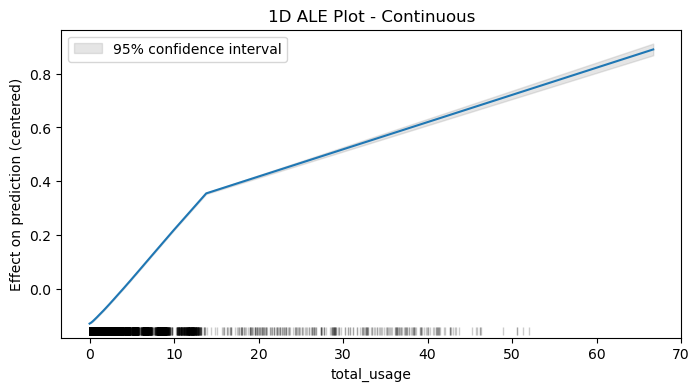

In [170]:
# ALE plot 1D - total_usage, target=1 (churn)
ale_total_usage = ale(
    X=X_train,
    model=logistic,
    feature=["total_usage"],
    include_CI=True,
    target=1,
    print_meanres=True
)

In [171]:
ale_total_usage

,eff,size,lowerCI_95%,upperCI_95%
total_usage,,,,
0.000000,-0.130492,0.0,NaN,NaN
0.125000,-0.128272,291.0,-0.128355,-0.128189
0.241667,-0.125448,269.0,-0.125548,-0.125348
0.366667,-0.122152,282.0,-0.122266,-0.122039
0.516667,-0.117710,281.0,-0.117838,-0.117583
0.700000,-0.112087,294.0,-0.112244,-0.111930
0.866667,-0.106996,270.0,-0.107149,-0.106843
1.083333,-0.099916,276.0,-0.100065,-0.099767
1.350000,-0.091371,294.0,-0.091568,-0.091173


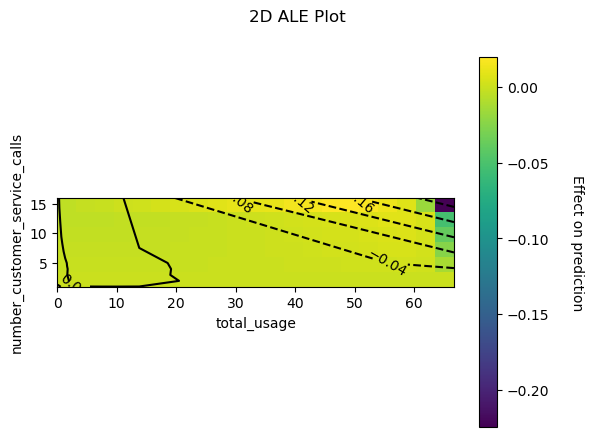

In [172]:
# ALE plot 2D - [number_customer_service_calls, total_usage], target=1 (churn)

ale_2d = ale(
    X=X_train,
    model=logistic,
    feature=["number_customer_service_calls", "total_usage"],
    contour=True,
    target=1)

In [173]:
ale_2d

total_usage,0.000000,0.125000,0.241667,0.366667,0.516667,0.700000,0.866667,1.083333,1.350000,1.666667,...,2.350000,2.800000,3.333333,4.080000,4.900000,5.900000,7.508333,9.916667,13.800000,66.700000
number_customer_service_calls,,,,,,,,,,,,,,,,,,,,,
1,0.000489,0.000391,0.000290,0.000173,0.000056,-0.000096,-0.000096,-0.000096,-0.000096,-0.000096,...,-0.000096,-0.000096,-0.000096,-0.000096,-0.000096,-0.000096,-0.000096,-0.000096,-0.000096,-0.000096
2,-0.000881,-0.000876,-0.000872,-0.000880,-0.000870,-0.000878,-0.000753,-0.000613,-0.000402,-0.000175,...,0.000253,0.000523,0.000836,0.001189,0.001540,0.001933,0.002323,0.002414,0.001738,-0.012018
3,-0.001979,-0.001876,-0.001765,-0.001662,-0.001527,-0.001414,-0.001164,-0.000870,-0.000468,-0.000035,...,0.000702,0.001221,0.001832,0.002509,0.002991,0.003641,0.004422,0.004576,0.002725,-0.024901
4,-0.003099,-0.002891,-0.002677,-0.002465,-0.002222,-0.001997,-0.001659,-0.001321,-0.000772,-0.000126,...,0.000974,0.001727,0.002553,0.003505,0.004179,0.004930,0.006202,0.006420,0.004264,-0.037937
5,-0.004076,-0.003769,-0.003439,-0.003133,-0.002767,-0.002418,-0.001946,-0.001445,-0.000692,0.000136,...,0.001615,0.002537,0.003617,0.004848,0.005752,0.006867,0.008539,0.008641,0.005169,-0.052124
16,-0.003733,-0.002193,-0.000837,0.000579,0.001629,0.003603,0.004666,0.006754,0.008810,0.010578,...,0.011706,0.015375,0.016165,0.019053,0.019576,0.017813,0.013504,0.007709,-0.017273,-0.224590


**ALE Plot 1D - total_usage, target=1 (churn):**

The ALE plot shows the relationship between the feature "total_usage" and the predicted probability of churn (target=1) in the logistic regression model. Here are the key insights:

**Overall Trend:** The ALE plot indicates that the relationship between "total_usage" and the predicted probability of churn is not linear. There is a non-linear effect observed.

**Changing Effect:** As the "total_usage" increases, the predicted probability of churn initially decreases and then starts to increase again. This suggests a non-monotonic relationship between "total_usage" and churn.

**Confidence Interval (CI):** The ALE plot includes a confidence interval, which represents the uncertainty in the estimated ALE values. The wider the CI, the greater the uncertainty in the ALE estimates.

**Mean Response:** The ALE plot provides the mean response, which represents the average predicted probability of churn across different values of "total_usage". It gives an overall summary of the relationship between the feature and the target.

**ALE Plot 2D - [number_customer_service_calls, total_usage], target=1 (churn):**

**Interaction Effect:** The ALE plot visualizes the interaction between the two features. It shows how their combined effects influence the predicted probability of churn.

**Contour Lines:** The contour lines on the plot indicate the regions of similar ALE values. Areas with closer contour lines suggest a stronger interaction effect, while areas with widely spaced contour lines indicate a weaker interaction.

**Interpretation:** The ALE plot helps understand how changes in "number_customer_service_calls" and "total_usage" together affect the predicted probability of churn. The slope and direction of the ALE curves reveal the direction and magnitude of the interaction effect between the features.

#### 4.1.5 Confusion Matrix

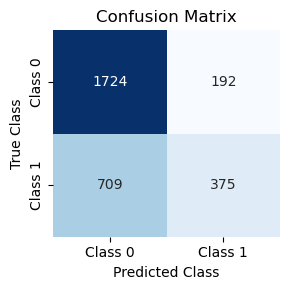

In [174]:
# Assuming you have trained a logistic regression model and obtained predictions
y_pred = logistic.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = ['Class 0', 'Class 1']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(3, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels, yticklabels=class_labels)

# Customize the plot
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.tight_layout()

# Display the plot
plt.show()

**INTERPRETATION FROM CONFUSION MATRIX**: 

- The model correctly predicted the non-churn of 1724 customers. This indicates that the model accurately identified and classified a significant number of customers who did not churn. This information is valuable for decision-making, as it helps allocate resources and focus efforts on retaining these customers.

- The model misclassified 192 customers as churners when they actually did not churn. This type of error could lead to unnecessary intervention or resource allocation for customers who were predicted to churn but did not. It is important to minimize false positive predictions to optimize resource allocation and prevent unnecessary costs.

- The model misclassified 709 customers as non-churners when they actually churned. This type of error can be costly as it may result in missed opportunities for intervention or retention efforts. It is crucial to minimize false negatives to identify and address customers who are likely to churn.

- The model correctly predicted the churn of 375 customers. This is important for identifying customers who are likely to churn and taking appropriate actions to prevent or mitigate churn. By accurately predicting churners, the model enables targeted retention strategies and customer-focused initiatives.

**The predictive performance of logistic regression model is very low as it contributes to more missclassifications and not correctly predict the actual churners**

#### 4.1.6 Hyperparameter Tunning

In [175]:
# Find the best parameters
cv = StratifiedKFold(n_splits=3, random_state=42, shuffle=True)
model = LogisticRegression(max_iter=500, class_weight='balanced',
                           solver='liblinear', random_state=42)  # liblinear, saga
parameters = {'penalty': ['l1', 'l2'],
              'C': [0.001, 0.01, 0.1, 0.5, 1, 2]}
clflr = GridSearchCV(model, parameters, scoring="roc_auc", n_jobs=-1, cv=cv, verbose=10, return_train_score=True)
clflr.fit(X_train, y_train)
best_test_idx = np.where(clflr.cv_results_['rank_test_score'] == 1)[0][0]
print('Best model - AUC train:', clflr.cv_results_['mean_train_score'][best_test_idx])
print('Best model - AUC test:', clflr.cv_results_['mean_test_score'][best_test_idx])
print("Best model - params:", clflr.best_params_)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best model - AUC train: 0.7156398790074444
Best model - AUC test: 0.6993834196394563
Best model - params: {'C': 0.5, 'penalty': 'l1'}


In [262]:
# Define a logistic regression model with L1 regularization
lr = LogisticRegression(penalty='l1', C=0.5, solver='liblinear')

# Train the model on the training data
lr.fit(X_train, y_train)

# Predict the class labels for the training and test sets
train_pred = lr.predict(X_train)
val_pred = lr.predict(X_val)
test_pred = lr.predict(X_test)

# Calculate the accuracy and AUC for the training set
train_acc = accuracy_score(y_train, train_pred)
train_auc = roc_auc_score(y_train, lr.predict_proba(X_train)[:, 1])
train_precision = precision_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)

# Calculate the accuracy and AUC for the training set
val_acc = accuracy_score(y_val, val_pred)
val_auc = roc_auc_score(y_val, lr.predict_proba(X_val)[:, 1])
val_precision = precision_score(y_val, val_pred)
val_recall = recall_score(y_val, val_pred)
val_f1 = f1_score(y_val, val_pred)

# Calculate the accuracy and AUC for the test set
test_acc = accuracy_score(y_test, test_pred)
test_auc = roc_auc_score(y_test, lr.predict_proba(X_test)[:, 1])
test_precision = precision_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)

# Create a dataframe to store the results
results_df = pd.DataFrame({
    'Dataset': ['Training', 'Validation', 'Test'],
    'Accuracy': [train_acc, val_acc, test_acc],
    'Precision': [train_precision, val_precision, test_precision],
    'Recall': [train_recall, val_recall, test_recall],
    'F1 Score': [train_f1, val_f1, test_f1],
    'AUC': [train_auc, val_auc, test_auc]
})

# Print the results
print(results_df)

# Print the classification report for the test set
print("\nClassification Report (Validation Set):\n")
print(classification_report(y_val, val_pred))

# Print the classification report for the test set
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, test_pred))

      Dataset  Accuracy  Precision    Recall  F1 Score       AUC
0    Training  0.708929   0.663121  0.374374  0.478567  0.712516
1  Validation  0.697143   0.686833  0.364839  0.476543  0.710725
2        Test  0.703000   0.660566  0.366236  0.471217  0.711727

Classification Report (Validation Set):

              precision    recall  f1-score   support

           0       0.70      0.90      0.79       871
           1       0.69      0.36      0.48       529

    accuracy                           0.70      1400
   macro avg       0.69      0.63      0.63      1400
weighted avg       0.69      0.70      0.67      1400


Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.71      0.89      0.79      1916
           1       0.66      0.37      0.47      1084

    accuracy                           0.70      3000
   macro avg       0.69      0.63      0.63      3000
weighted avg       0.69      0.70      0.68      3000



### 4.2 Random Forest

#### 4.2.1 Feature importances:

In [101]:
df_fi = pd.DataFrame(randomForest.feature_importances_, index=X_train.columns, columns=["Importance"])
df_fi = df_fi.sort_values(by="Importance", ascending=False)
df_fi = df_fi.reset_index().rename(columns={'index': 'Features'})
df_fi

,Features,Importance
0,discount,0.145354
1,account_length,0.120278
2,last_renewal,0.095865
3,total_usage,0.094883
4,ad_spend,0.092630
...,...,...
59,state_New Hampshire,0.002544
60,state_Wisconsin,0.002525
61,state_Florida,0.002352
62,state_Wyoming,0.002044


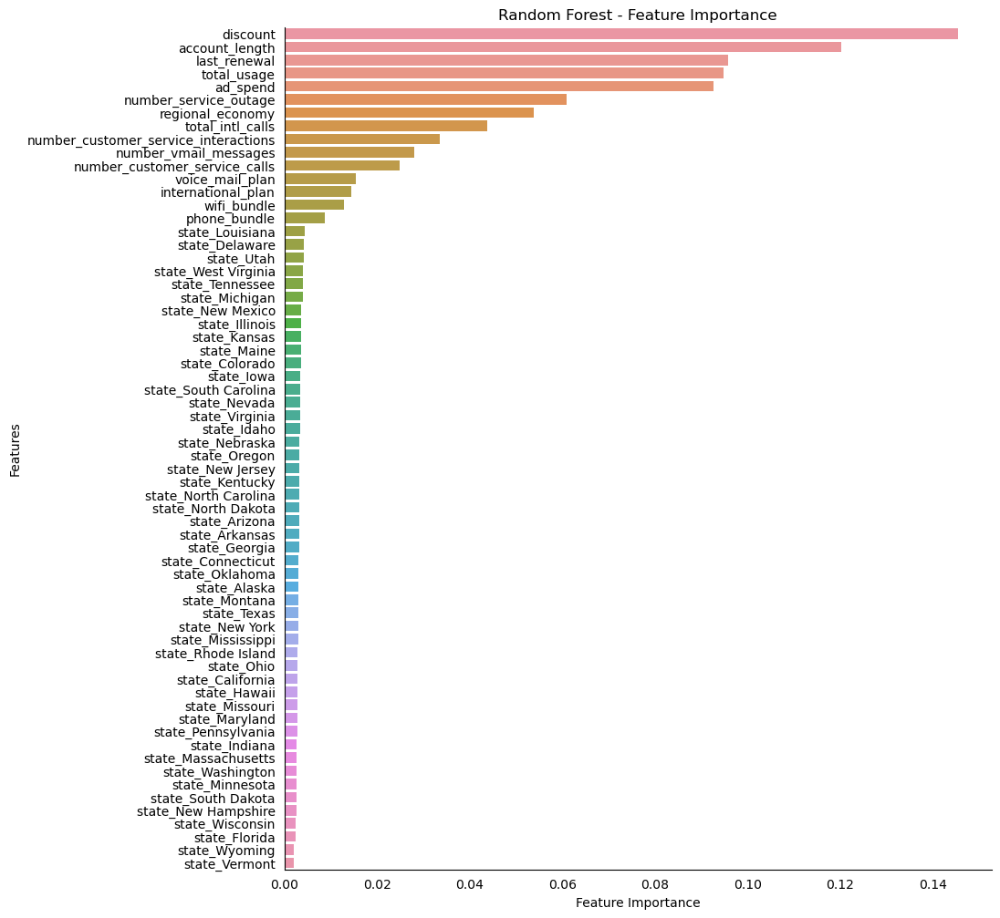

In [102]:
# Plot feature importances
plt.figure(figsize=(10, 12))
sns.barplot(x="Importance", y="Features", data=df_fi)

# Add labels and title
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Random Forest - Feature Importance")

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

>**Interpretation**: The above list shows the top 5 and bottom 5 coefficients along with their corresponding feature importances from the random forest model. These coefficients indicate the strength and direction of the relationship between each feature and the target variable ('churn').

**Top 5 Positive Coefficients**:

- **Discount:** This feature has the highest positive coefficient (0.145), indicating that an increase in the discount offered to customers leads to a higher likelihood of the desired outcome.

- **Account Length:** Longer account length has a positive influence on the target variable, with a coefficient of 0.120. Customers who have been with the company for a longer duration are more likely to exhibit the desired outcome.

- **Last Renewal:** The timing of the last renewal has a positive impact on the target variable, with a coefficient of 0.095. Customers who recently renewed their subscription are more likely to exhibit the desired outcome.

- **Total Usage:** Higher total usage by customers has a positive influence on the target variable, with a coefficient of 0.094. Customers who use the service more frequently are more likely to exhibit the desired outcome.

- **Ad Spend:** Increased advertising spend has a positive impact on the target variable, with a coefficient of 0.092. Higher investments in advertising campaigns are associated with a higher likelihood of the desired outcome.

**Least 5 Coefficients**:

- **State New Hampshire:** Customers from New Hampshire have a minimal positive influence on the target variable, with a coefficient of 0.00254.

- **State Wisconsin:** Customers from Wisconsin have a minimal positive influence on the target variable, with a coefficient of 0.00252.

- **State Florida:** Customers from Florida have a minimal positive influence on the target variable, with a coefficient of 0.00235.

- **State Wyoming:** Customers from Wyoming have a minimal positive influence on the target variable, with a coefficient of 0.00204.

- **State Vermont:** Customers from Vermont have a minimal positive influence on the target variable, with a coefficient of 0.00198.

#### 4.2.2 Partial Dependency Plots (PDP)

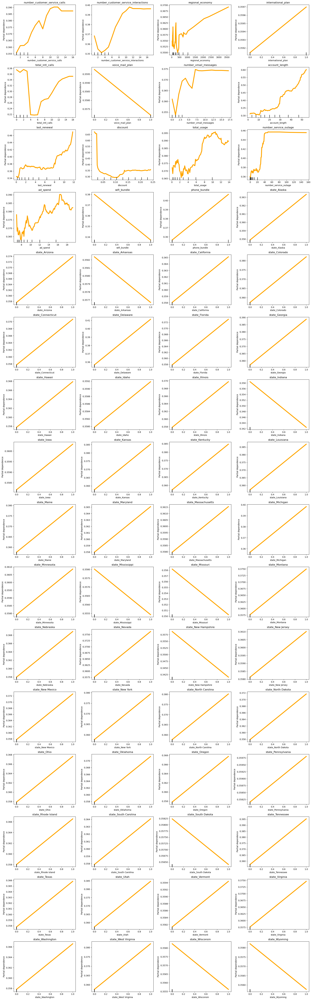

In [182]:
# Plot partial dependence

num_plots = len(X_train.columns)
num_rows = (num_plots + 3) // 4  # Calculate the number of rows needed
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 4*num_rows))  # Adjust the figsize for wider plots

for i, feature in enumerate(X_train.columns):
    row = i // 4  # Calculate the row index
    col = i % 4  # Calculate the column index
    ax = axs[row, col] if num_rows > 1 else axs[col]  # Adjust indexing for single-row plots
    pdp_display = PartialDependenceDisplay.from_estimator(estimator=randomForest, X=X_train, features=[feature], ax=ax)
    ax.set_title(feature)
    pdp_display.plot(ax=pdp_display.axes_[0], pd_line_kw={"color": "#ffa500", "linewidth": 4, "alpha": 1})

fig.tight_layout()
plt.show()

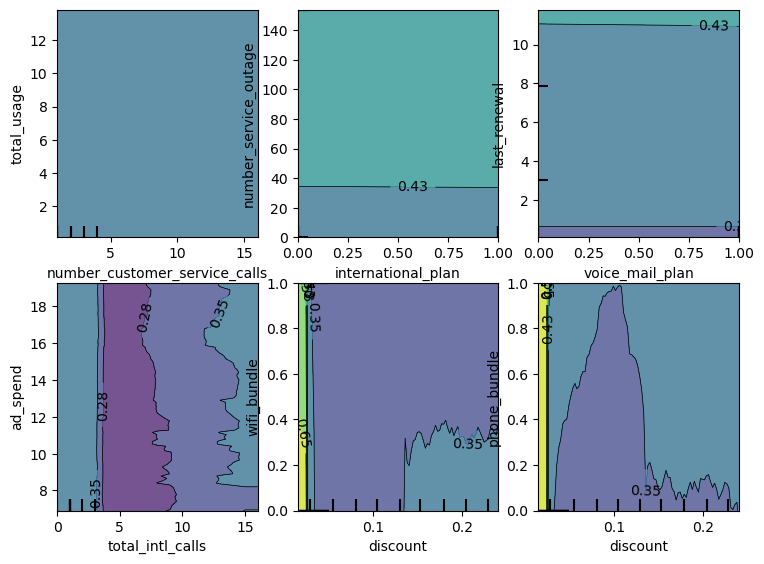

In [184]:
# Plot partial dependence (interaction variables of interest)

fig, ax = plt.subplots(figsize=(8, 6))
PartialDependenceDisplay.from_estimator(estimator=randomForest, X=X_train, features=[(0,10),(3,11),(5,8),(4,12),(9,13),(9,14)], ax=ax)
fig.tight_layout(pad=2.0)

**INTERPRETATION OF PARTIAL DEPENDENCY PLOTS**:

By examining the PDP, we can observe how the selected feature's values relate to the predicted outcome. The Y-axis values represent the average predicted outcome (e.g., probability) for each value of the feature, holding other features constant.
The slope or direction of the line indicates the direction and strength of the relationship between the feature and the predicted outcome. If the line is upward-sloping, it suggests a positive relationship where higher values of the feature correspond to a higher predicted outcome. Conversely, a downward-sloping line indicates a negative relationship.
By analyzing the partial dependence plot, we can understand how changes in the selected feature's values impact the predicted outcome, gain insights into the feature's importance, and identify any nonlinearity or interaction effects with other features.

The small black spikes along the X-axis indicate the distribution of the feature values in the dataset. They help visualize how prevalent each value is and give an idea of the data distribution.

- *number_customer_service_calls*: As the number of customer service calls increases, the predicted probability of churn has an waviying pattern. This indicates a positive monotonic relationship between the number of customer service calls and the likelihood of churn.

- *international_plan*: As the international_plan feature increases, the predicted probability of the desired outcome also increases. Customers with a specific international plan have a higher likelihood of the desired outcome compared to those without it.

- *phone_bundle*: As the phone_bundle feature increases, the predicted probability of the desired outcome also increases. Customers with a specific phone bundle have a higher likelihood of the desired outcome compared to those without it.

- *wifi_bundle*: As the wifi_bundle feature increases, the predicted probability of the desired outcome decreases. Customers with a specific wifi bundle have a lower likelihood of the desired outcome compared to those without it.

- *voice_mail_plan*: As the voice_mail_plan feature increases, the predicted probability of the desired outcome decreases. Customers with a specific voice mail plan have a lower likelihood of the desired outcome compared to those without it.

#### 4.2.3 SHAP

Permutation explainer: 3001it [32:59,  1.51it/s]                                                                       


shap.explainers.Permutation()


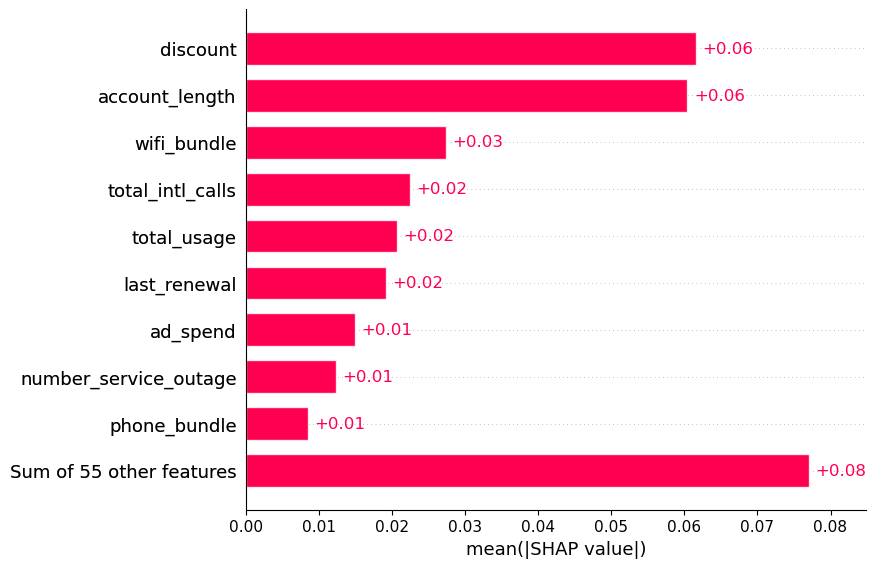

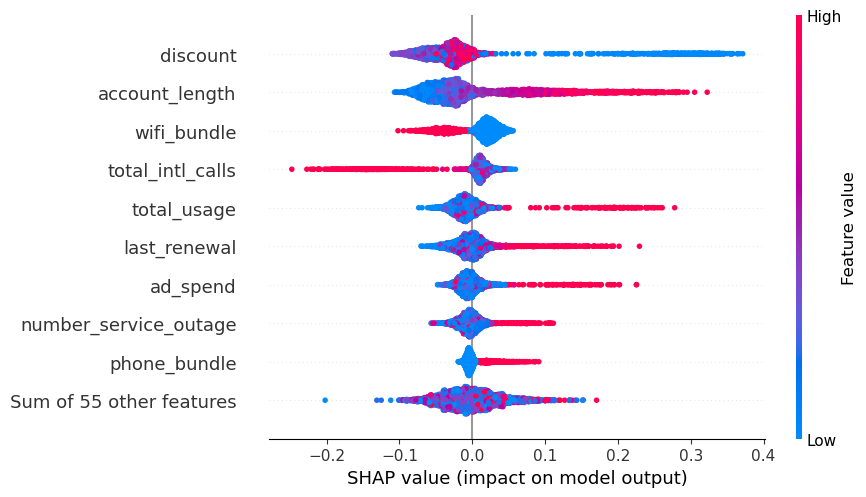

In [185]:
# set up explainer for ".predict_proba" method
explainer = shap.Explainer(randomForest.predict_proba, X_test)

# compute shap values
shap_values = explainer(X_test)

# check explainer type
print(str(explainer)) # make sure your are using the intended explainer

# check explainer type
print(str(explainer.masker))

# feature importance (global)
# bar chart
shap.plots.bar(shap_values[:,:,1])

# individual dots for each instance
shap.plots.beeswarm(shap_values[:,:,1])

#### 4.2.4 LIME

In [186]:
# Initialize explainer
explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=list(X_train.columns),
    discretize_continuous=True,
    mode="classification",
    class_names=["0", "1"]
)

# explain first instance in test set
exp = explainer.explain_instance(X_test.iloc[0], randomForest.predict_proba)
exp.show_in_notebook(show_table=True, show_all=True)

# inspect explanation object
exp.__dict__

{'random_state': None,
 'mode': 'classification',
 'domain_mapper': <lime.lime_tabular.TableDomainMapper at 0x22c14b07fd0>,
 'local_exp': {1: [(4, -0.11987399118164992),
   (9, -0.05937799380113862),
   (13, 0.054395086633372544),
   (27, 0.04854431540649621),
   (8, 0.047394418980838585),
   (62, 0.040962737480463925),
   (35, -0.03784746931080722),
   (14, -0.03414089144648934),
   (46, -0.027427644800505132),
   (44, -0.024285750188230516)]},
 'intercept': {1: 0.4215391909660218},
 'score': 0.1683869827870318,
 'local_pred': array([0.30988201]),
 'class_names': ['0', '1'],
 'top_labels': None,
 'predict_proba': array([0.96, 0.04])}

In [187]:
# display Model prediction vs LIME prediction
pd.DataFrame(
    [exp.local_pred.item(), exp.predict_proba[1]],
    index=["LIME Prediction", "Model Prediction"],
    columns=["Probability"]
    )

,Probability
LIME Prediction,0.309882
Model Prediction,0.040000


In [188]:
# display coefficients of LIME local regression model

# Create a dataframe and merge intercept
coef = exp.local_exp[1]
coef = sorted(coef, key=lambda x: x[0])  # Sort by index

# Create a DataFrame and merge intercept
df_coef = pd.DataFrame(coef, columns=["index", "beta"]).set_index("index")
df_coef.index = X_train.columns[df_coef.index]  # Set feature names as index
df_coef.loc["INTERCEPT"] = exp.intercept[1]

df_coef

,beta
total_intl_calls,-0.119874
last_renewal,0.047394
discount,-0.059378
wifi_bundle,0.054395
phone_bundle,-0.034141
state_Indiana,0.048544
state_Michigan,-0.037847
state_New Mexico,-0.024286
state_North Carolina,-0.027428
state_Wisconsin,0.040963


In [189]:
# display attribution table
pd.DataFrame(exp.as_list(),columns=['Feature','Attribution'])

,Feature,Attribution
0,total_intl_calls > 2.00,-0.119874
1,0.07 < discount <= 0.13,-0.059378
2,wifi_bundle <= 0.00,0.054395
3,state_Indiana <= 0.00,0.048544
4,last_renewal > 5.54,0.047394
5,state_Wisconsin <= 0.00,0.040963
6,state_Michigan <= 0.00,-0.037847
7,phone_bundle <= 0.00,-0.034141
8,state_North Carolina <= 0.00,-0.027428
9,state_New Mexico <= 0.00,-0.024286


#### 4.2.5 ALE (Accumulated Local Effects)

PyALE._ALE_generic:INFO: Continuous feature detected.


Mean response: 0.35817


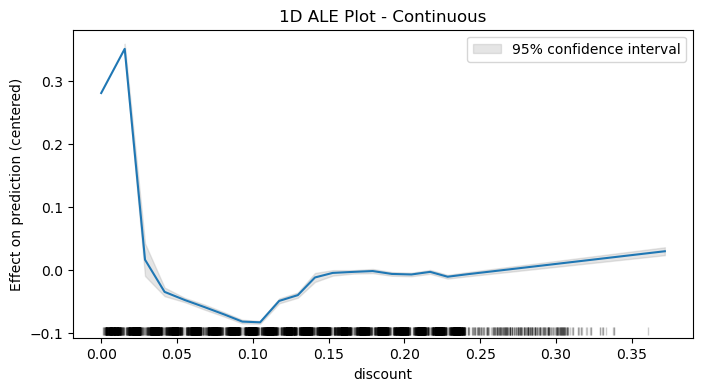

In [190]:
# ALE plot 1D - discount, target=1 (churn)
ale_total_usage = ale(
    X=X_train,
    model=randomForest,
    feature=["discount"],
    include_CI=True,
    target=1,
    print_meanres=True
)

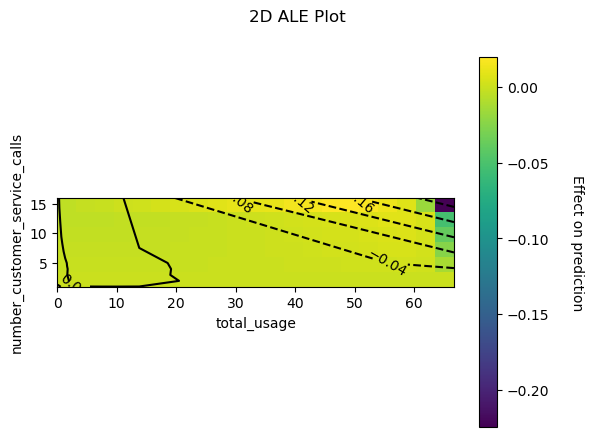

In [191]:
# ALE plot 2D - [number_customer_service_calls, total_usage], target=1 (churn)

ale_2d = ale(
    X=X_train,
    model=logistic,
    feature=["number_customer_service_calls", "total_usage"],
    contour=True,
    target=1)

#### 4.2.6 Confusion Matrix

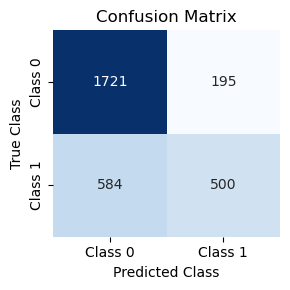

In [192]:
# Assuming you have trained a random forest model and obtained predictions
y_pred = randomForest.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = ['Class 0', 'Class 1']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(3, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels, yticklabels=class_labels)

# Customize the plot
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.tight_layout()

# Display the plot
plt.show()

#### 4.2.7 Hyperparameter Tunning

In [194]:
# Define the parameter grid to search
param_grid = {'n_estimators': [100, 200, 300, 400, 500],
              'max_depth': [1, 2, 3, 5, 10, 15, None],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4],
              'bootstrap': [True, False]}

# Create the GridSearchCV object
cv = StratifiedKFold(n_splits=3, random_state=42, shuffle=True)
model = RandomForestClassifier(class_weight="balanced", random_state=42)
clfrf = GridSearchCV(model, param_grid, scoring='roc_auc', n_jobs=-1, cv=cv, verbose=10, return_train_score=True)

# Fit the GridSearchCV object to the data
clfrf.fit(X_train, y_train)

best_test_idx = np.where(clfrf.cv_results_['rank_test_score'] == 1)[0][0]
print('Best model - AUC train:', clfrf.cv_results_['mean_train_score'][best_test_idx])
print('Best model - AUC test:', clfrf.cv_results_['mean_test_score'][best_test_idx])
print("Best model - params:", clfrf.best_params_)

Fitting 3 folds for each of 630 candidates, totalling 1890 fits
Best model - AUC train: 0.8664592614990485
Best model - AUC test: 0.7560765150384912
Best model - params: {'bootstrap': False, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}


In [263]:
# Define a random forest classifier with the best parameters
rf = RandomForestClassifier(bootstrap=True, max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42)

# Train the model on the training data
rf.fit(X_train, y_train)

# Predict the class labels for the training and test sets
train_pred = rf.predict(X_train)
test_pred = rf.predict(X_test)

# Calculate the accuracy and AUC for the training set
train_acc = accuracy_score(y_train, train_pred)
train_auc = roc_auc_score(y_train, rf.predict_proba(X_train)[:, 1])
train_precision = precision_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)

# Calculate the accuracy and AUC for the training set
val_acc = accuracy_score(y_val, val_pred)
val_auc = roc_auc_score(y_val, rf.predict_proba(X_val)[:, 1])
val_precision = precision_score(y_val, val_pred)
val_recall = recall_score(y_val, val_pred)
val_f1 = f1_score(y_val, val_pred)

# Calculate the accuracy and AUC for the test set
test_acc = accuracy_score(y_test, test_pred)
test_auc = roc_auc_score(y_test, rf.predict_proba(X_test)[:, 1])
test_precision = precision_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)

# Create a dataframe to store the results
results_df = pd.DataFrame({
    'Dataset': ['Training', 'Validation', 'Test'],
    'Accuracy': [train_acc, val_acc, test_acc],
    'Precision': [train_precision, val_precision, test_precision],
    'Recall': [train_recall, val_recall, test_recall],
    'F1 Score': [train_f1, val_f1, test_f1],
    'AUC': [train_auc, val_auc, test_auc]
})

# Print the results
print(results_df)

# Print the classification report for the test set
print("\nClassification Report (Validation Set):\n")
print(classification_report(y_val, val_pred))

# Print the classification report for the test set
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, test_pred))

      Dataset  Accuracy  Precision    Recall  F1 Score       AUC
0    Training  0.768750   0.832545  0.440440  0.576105  0.829397
1  Validation  0.697143   0.686833  0.364839  0.476543  0.757958
2        Test  0.746000   0.764803  0.428967  0.549645  0.756467

Classification Report (Validation Set):

              precision    recall  f1-score   support

           0       0.70      0.90      0.79       871
           1       0.69      0.36      0.48       529

    accuracy                           0.70      1400
   macro avg       0.69      0.63      0.63      1400
weighted avg       0.69      0.70      0.67      1400


Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.74      0.93      0.82      1916
           1       0.76      0.43      0.55      1084

    accuracy                           0.75      3000
   macro avg       0.75      0.68      0.69      3000
weighted avg       0.75      0.75      0.72      3000



### 4.5 Extreme Gradient Boosting

#### 4.5.1 Feature Importance:

In [103]:
df_xgb = pd.DataFrame(xgb.feature_importances_, index=X_train.columns, columns=["Importance"])
df_xgb = df_xgb.sort_values(by="Importance", ascending=False)
df_xgb = df_xgb.reset_index().rename(columns={'index': 'Features'})
df_xgb

,Features,Importance
0,account_length,0.042204
1,state_Michigan,0.041541
2,state_New Mexico,0.029344
3,state_Washington,0.029162
4,total_intl_calls,0.028030
...,...,...
59,state_North Carolina,0.003665
60,state_Rhode Island,0.002401
61,state_California,0.000000
62,state_Arizona,0.000000


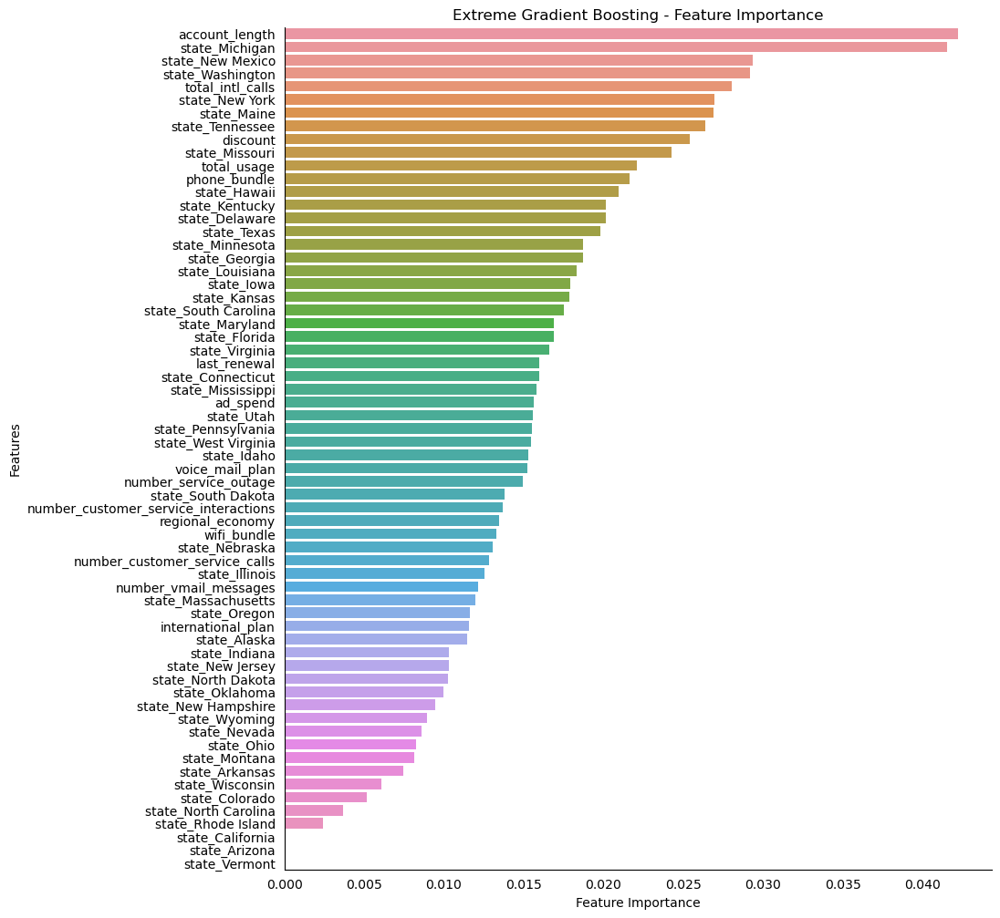

In [104]:
# Plot feature importances
plt.figure(figsize=(10, 12))
sns.barplot(x="Importance", y="Features", data=df_xgb)

# Add labels and title
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Extreme Gradient Boosting - Feature Importance")

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# remove the gridlines
plt.grid(False)

# Remove the ticks                                     
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)

#### 4.5.2 Partial Dependency Plots (PDP)

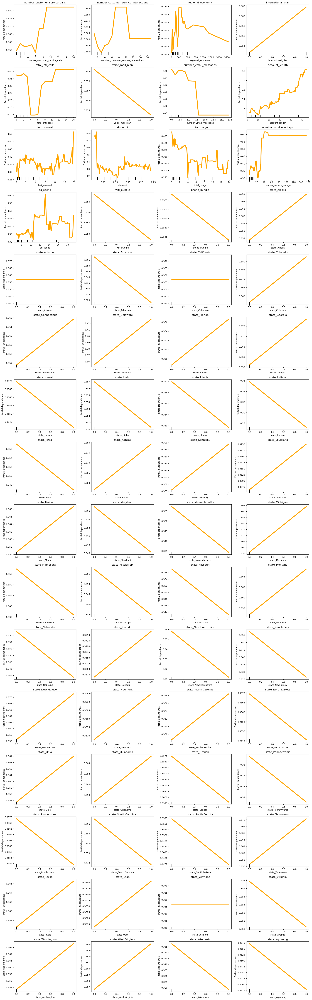

In [198]:
# Plot partial dependence

num_plots = len(X_train.columns)
num_rows = (num_plots + 3) // 4  # Calculate the number of rows needed
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 4*num_rows))  # Adjust the figsize for wider plots

for i, feature in enumerate(X_train.columns):
    row = i // 4  # Calculate the row index
    col = i % 4  # Calculate the column index
    ax = axs[row, col] if num_rows > 1 else axs[col]  # Adjust indexing for single-row plots
    pdp_display = PartialDependenceDisplay.from_estimator(estimator=xgb, X=X_train, features=[feature], ax=ax)
    ax.set_title(feature)
    pdp_display.plot(ax=pdp_display.axes_[0], pd_line_kw={"color": "#ffa500", "linewidth": 4, "alpha": 1})

fig.tight_layout()
plt.show()

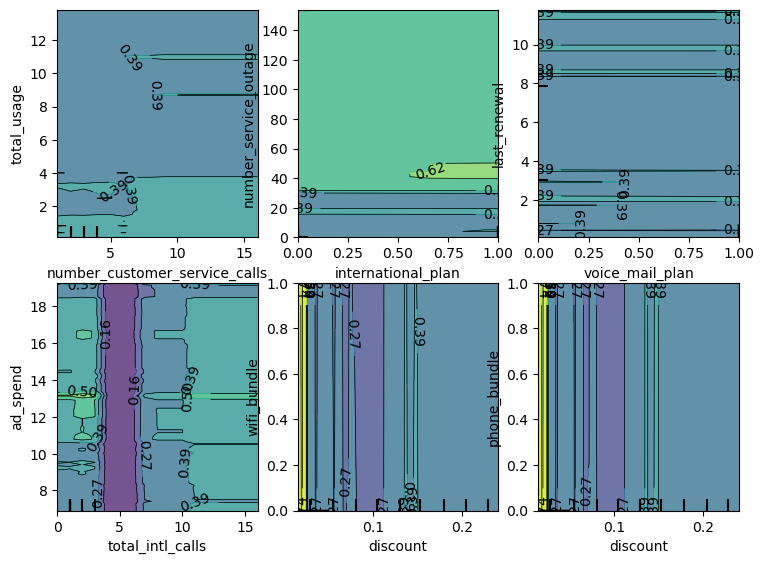

In [199]:
# Plot partial dependence (interaction variables of interest)

fig, ax = plt.subplots(figsize=(8, 6))
PartialDependenceDisplay.from_estimator(estimator=xgb, X=X_train, features=[(0,10),(3,11),(5,8),(4,12),(9,13),(9,14)], ax=ax)
fig.tight_layout(pad=2.0)

**INTERPRETATION OF PARTIAL DEPENDENCY PLOTS**:

By examining the PDP, we can observe how the selected feature's values relate to the predicted outcome. The Y-axis values represent the average predicted outcome (e.g., probability) for each value of the feature, holding other features constant.
The slope or direction of the line indicates the direction and strength of the relationship between the feature and the predicted outcome. If the line is upward-sloping, it suggests a positive relationship where higher values of the feature correspond to a higher predicted outcome. Conversely, a downward-sloping line indicates a negative relationship.
By analyzing the partial dependence plot, we can understand how changes in the selected feature's values impact the predicted outcome, gain insights into the feature's importance, and identify any nonlinearity or interaction effects with other features.

The small black spikes along the X-axis indicate the distribution of the feature values in the dataset. They help visualize how prevalent each value is and give an idea of the data distribution.

- *number_customer_service_calls*: As the number of customer service calls increases, the predicted probability of churn has an waviying pattern. This indicates a positive monotonic relationship between the number of customer service calls and the likelihood of churn.

- *international_plan*: As the international_plan feature increases, the predicted probability of the desired outcome also increases. Customers with a specific international plan have a higher likelihood of the desired outcome compared to those without it.

- *phone_bundle*: As the phone_bundle feature increases, the predicted probability of the desired outcome also increases. Customers with a specific phone bundle have a higher likelihood of the desired outcome compared to those without it.

- *wifi_bundle*: As the wifi_bundle feature increases, the predicted probability of the desired outcome decreases. Customers with a specific wifi bundle have a lower likelihood of the desired outcome compared to those without it.

- *voice_mail_plan*: As the voice_mail_plan feature increases, the predicted probability of the desired outcome decreases. Customers with a specific voice mail plan have a lower likelihood of the desired outcome compared to those without it.

#### 4.5.3 SHAP

Permutation explainer: 3001it [06:52,  7.28it/s]                                                                       


shap.explainers.Permutation()


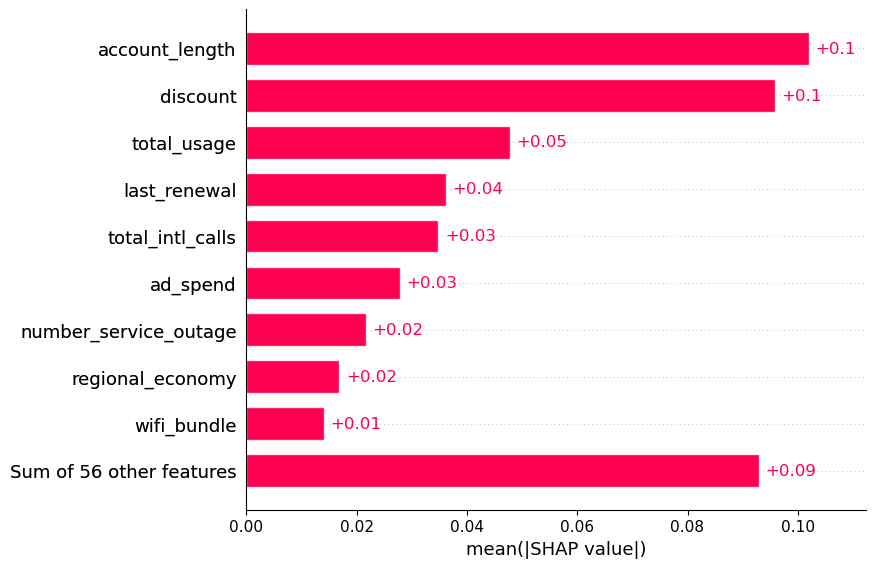

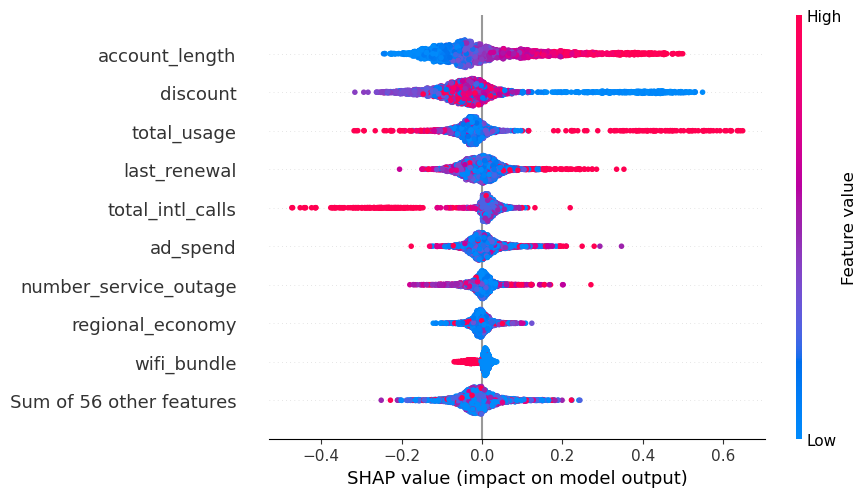

In [61]:
# set up explainer for ".predict_proba" method
explainer = shap.Explainer(xgb.predict_proba, X_test)

# compute shap values
shap_values = explainer(X_test)

# check explainer type
print(str(explainer)) # make sure your are using the intended explainer

# check explainer type
print(str(explainer.masker))

# feature importance (global)

# bar chart
shap.plots.bar(shap_values[:,:,1])

# individual dots for each instance
shap.plots.beeswarm(shap_values[:,:,1])

#### 4.5.4 LIME

In [200]:
# Initialize explainer
explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=list(X_train.columns),
    discretize_continuous=True,
    mode="classification",
    class_names=["0", "1"]
)

# explain first instance in test set
exp = explainer.explain_instance(X_test.iloc[0], xgb.predict_proba)
exp.show_in_notebook(show_table=True, show_all=True)

# inspect explanation object
exp.__dict__

{'random_state': None,
 'mode': 'classification',
 'domain_mapper': <lime.lime_tabular.TableDomainMapper at 0x22c11222070>,
 'local_exp': {1: [(4, -0.21100117112209368),
   (9, -0.14699330064581978),
   (34, 0.11059244379277867),
   (21, -0.10147716090554332),
   (27, 0.09557129171921426),
   (35, -0.08621220573776375),
   (30, -0.08576666532285912),
   (8, 0.059226660861639226),
   (40, 0.057502464416120405),
   (17, 0.05433996422191455)]},
 'intercept': {1: 0.4312441878730808},
 'score': 0.11931038848650644,
 'local_pred': array([0.17702651]),
 'class_names': ['0', '1'],
 'top_labels': None,
 'predict_proba': array([0.98741627, 0.01258375], dtype=float32)}

In [201]:
# display Model prediction vs LIME prediction
pd.DataFrame(
    [exp.local_pred.item(), exp.predict_proba[1]],
    index=["LIME Prediction", "Model Prediction"],
    columns=["Probability"]
    )

,Probability
LIME Prediction,0.177027
Model Prediction,0.012584


In [202]:
# display coefficients of LIME local regression model

# Create a dataframe and merge intercept
coef = exp.local_exp[1]
coef = sorted(coef, key=lambda x: x[0])  # Sort by index

# Create a DataFrame and merge intercept
df_coef = pd.DataFrame(coef, columns=["index", "beta"]).set_index("index")
df_coef.index = X_train.columns[df_coef.index]  # Set feature names as index
df_coef.loc["INTERCEPT"] = exp.intercept[1]

df_coef

,beta
total_intl_calls,-0.211001
last_renewal,0.059227
discount,-0.146993
state_Arkansas,0.054340
state_Delaware,-0.101477
state_Indiana,0.095571
state_Kentucky,-0.085767
state_Massachusetts,0.110592
state_Michigan,-0.086212
state_Nebraska,0.057502


In [203]:
# display attribution table
pd.DataFrame(exp.as_list(),columns=['Feature','Attribution'])

,Feature,Attribution
0,total_intl_calls > 2.00,-0.211001
1,0.07 < discount <= 0.13,-0.146993
2,state_Massachusetts <= 0.00,0.110592
3,state_Delaware <= 0.00,-0.101477
4,state_Indiana <= 0.00,0.095571
5,state_Michigan <= 0.00,-0.086212
6,state_Kentucky <= 0.00,-0.085767
7,last_renewal > 5.54,0.059227
8,state_Nebraska <= 0.00,0.057502
9,state_Arkansas <= 0.00,0.054340


#### 4.5.5 ALE (Accumulated Local Effects)

PyALE._ALE_generic:INFO: Continuous feature detected.


Mean response: 0.35685


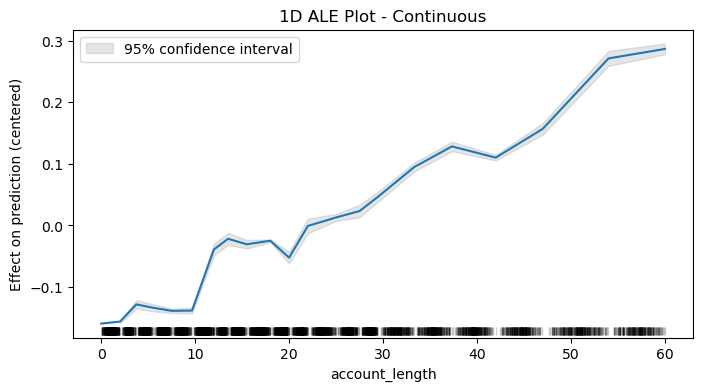

In [204]:
# ALE plot 1D - account_length, target=1 (churn)
ale_total_usage = ale(
    X=X_train,
    model=xgb,
    feature=["account_length"],
    include_CI=True,
    target=1,
    print_meanres=True
)

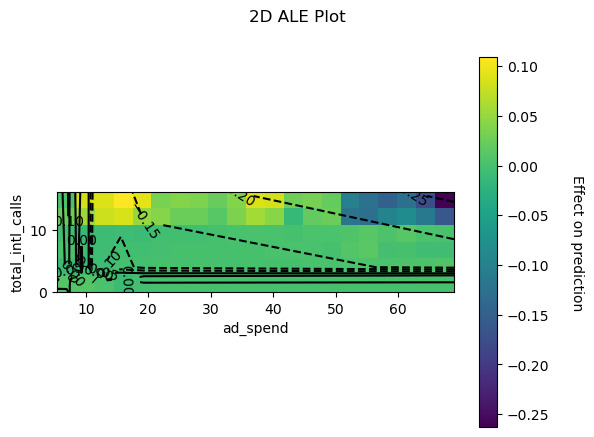

In [205]:
# ALE plot 2D - [total_intl_calls, ad_spend], target=1 (churn)

ale_2d = ale(
    X=X_train,
    model=xgb,
    feature=["total_intl_calls", "ad_spend"],
    contour=True,
    target=1)

#### 4.5.5 Confusion Matrix

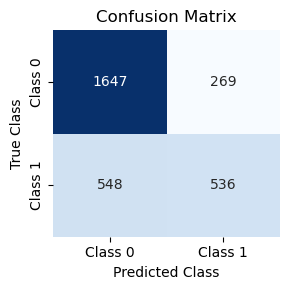

In [206]:
# Assuming you have trained a random forest model and obtained predictions
y_pred = xgb.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = ['Class 0', 'Class 1']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(3, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels, yticklabels=class_labels)

# Customize the plot
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.tight_layout()

# Display the plot
plt.show()

#### 4.5.6 Hyperparameter Tunning

In [207]:
# Define the parameter grid to search
parameters = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}
# Create the GridSearchCV object
cv = StratifiedKFold(n_splits=3, random_state=42, shuffle=True)
model = XGBClassifier(class_weight="balanced", random_state=42)
clfrf = GridSearchCV(model, param_grid, scoring='roc_auc', n_jobs=-1, cv=cv, verbose=10, return_train_score=True)

# Fit the GridSearchCV object to the data
clfrf.fit(X_train, y_train)

best_test_idx = np.where(clfrf.cv_results_['rank_test_score'] == 1)[0][0]
print('Best model - AUC train:', clfrf.cv_results_['mean_train_score'][best_test_idx])
print('Best model - AUC test:', clfrf.cv_results_['mean_test_score'][best_test_idx])
print("Best model - params:", clfrf.best_params_)

Fitting 3 folds for each of 630 candidates, totalling 1890 fits
[22:02:36] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "bootstrap", "class_weight", "min_samples_leaf", "min_samples_split" } are not used.

Best model - AUC train: 0.7939196164665162
Best model - AUC test: 0.762040702234291
Best model - params: {'bootstrap': True, 'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [211]:
# Define a random forest classifier with the best parameters
xgb = XGBClassifier(max_depth= 1, n_estimators= 200, random_state=42)

# Train the model on the training data
xgb.fit(X_train, y_train)

# Predict the class labels for the training and test sets
train_pred = xgb.predict(X_train)
val_pred = xgb.predict(X_val)
test_pred = xgb.predict(X_test)

# Calculate the accuracy and AUC for the training set
train_acc = accuracy_score(y_train, train_pred)
train_auc = roc_auc_score(y_train, xgb.predict_proba(X_train)[:, 1])
train_precision = precision_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)

# Calculate the accuracy and AUC for the v alidation set
val_acc = accuracy_score(y_val, val_pred)
val_auc = roc_auc_score(y_val, xgb.predict_proba(X_val)[:, 1])
val_precision = precision_score(y_val, val_pred)
val_recall = recall_score(y_val, val_pred)
val_f1 = f1_score(y_val, val_pred)

# Calculate the accuracy and AUC for the test set
test_acc = accuracy_score(y_test, test_pred)
test_auc = roc_auc_score(y_test, xgb.predict_proba(X_test)[:, 1])
test_precision = precision_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)

# Create a dataframe to store the results
results_df = pd.DataFrame({
    'Dataset': ['Training', 'Validation', 'Test'],
    'Accuracy': [train_acc, val_acc, test_acc],
    'Precision': [train_precision, val_precision, test_precision],
    'Recall': [train_recall, val_recall, test_recall],
    'F1 Score': [train_f1, val_f1, test_f1],
    'AUC': [train_auc, val_auc, test_auc]
})

# Print the results
print(results_df)

# Print the classification report for the test set
print("\nClassification Report (Validation Set):\n")
print(classification_report(y_val, val_pred))

# Print the classification report for the test set
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, test_pred))

      Dataset  Accuracy  Precision    Recall  F1 Score       AUC
0    Training  0.758214   0.776158  0.452953  0.572061  0.787805
1  Validation  0.735714   0.773196  0.425331  0.548780  0.762250
2        Test  0.747333   0.746224  0.455720  0.565865  0.771859

Classification Report (Validation Set):

              precision    recall  f1-score   support

           0       0.73      0.92      0.81       871
           1       0.77      0.43      0.55       529

    accuracy                           0.74      1400
   macro avg       0.75      0.67      0.68      1400
weighted avg       0.74      0.74      0.71      1400


Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.75      0.91      0.82      1916
           1       0.75      0.46      0.57      1084

    accuracy                           0.75      3000
   macro avg       0.75      0.68      0.69      3000
weighted avg       0.75      0.75      0.73      3000



## 5. Feature Selection & Modeling

#### 5.1. TOP 10 FEATURES FROM MUTUAL INFORMATION GAIN

In [314]:
# Select only the top 10 features in X_train, X_val, and X_test
X_train_selected_mi = X_train[top_10_features_mi]
X_val_selected_mi = X_val[top_10_features_mi]
X_test_selected_mi = X_test[top_10_features_mi]

In [316]:
# Train the models on the selected features
for model in models:
    models[model].fit(X_train_selected_mi, y_train)
    print(f"{model} has been trained successfully")

performances = {}

for model in models:
    # Predictions for train, validation, and test sets
    predictions_train = models[model].predict(X_train_selected_mi)
    predictions_val = models[model].predict(X_val_selected_mi)
    predictions_test = models[model].predict(X_test_selected_mi)

    # Probabilities for train, validation, and test sets
    probabilities_train = pd.DataFrame(models[model].predict_proba(X_train_selected_mi))[1]
    probabilities_val = pd.DataFrame(models[model].predict_proba(X_val_selected_mi))[1]
    probabilities_test = pd.DataFrame(models[model].predict_proba(X_test_selected_mi))[1]

    # Accuracy Metrics
    accuracy_train = accuracy_score(y_train, predictions_train)
    accuracy_val = accuracy_score(y_val, predictions_val)
    accuracy_test = accuracy_score(y_test, predictions_test)

    # AUC Metrics
    auc_train = roc_auc_score(y_train, probabilities_train)
    auc_val = roc_auc_score(y_val, probabilities_val)
    auc_test = roc_auc_score(y_test, probabilities_test)

    # Precision Metrics
    precision_train = precision_score(y_train, predictions_train)
    precision_val = precision_score(y_val, predictions_val)
    precision_test = precision_score(y_test, predictions_test)

    # Recall Metrics
    recall_train = recall_score(y_train, predictions_train)
    recall_val = recall_score(y_val, predictions_val)
    recall_test = recall_score(y_test, predictions_test)

    # F-1 Metrics
    f1_train = f1_score(y_train, predictions_train)
    f1_val = f1_score(y_val, predictions_val)
    f1_test = f1_score(y_test, predictions_test)

    # Combining Performances of all models
    performances[model] = {
        "Accuracy Train": accuracy_train,
        "Accuracy Validation": accuracy_val,
        "Accuracy Test": accuracy_test,
        "AUC Train": auc_train,
        "AUC Validation": auc_val,
        "AUC Test": auc_test,
        "Precision Train": precision_train,
        "Precision Validation": precision_val,
        "Precision Test": precision_test,
        "Recall Train": recall_train,
        "Recall Validation": recall_val,
        "Recall Test": recall_test,
        "F1 Score Train": f1_train,
        "F1 Score Validation": f1_val,
        "F1 Score Test": f1_test
    }

pd.DataFrame(performances)

logistic has been trained successfully
randomForest has been trained successfully
xgb has been trained successfully


,logistic,randomForest,xgb
Accuracy Train,0.705179,1.000000,0.906607
Accuracy Validation,0.699286,0.712857,0.706429
Accuracy Test,0.702333,0.738333,0.730667
AUC Train,0.703032,1.000000,0.979665
AUC Validation,0.714080,0.723604,0.715867
AUC Test,0.712453,0.736890,0.735821
Precision Train,0.653404,1.000000,0.973060
Precision Validation,0.690141,0.689552,0.668571
Precision Test,0.663248,0.699068,0.676020
Recall Train,0.369870,1.000000,0.759259


#### 5.2. TOP 10 FEATURES FROM FISHER SCORE

In [182]:
top_10_features_fs

['account_length',
 'total_usage',
 'last_renewal',
 'number_service_outage',
 'wifi_bundle',
 'ad_spend',
 'discount',
 'total_intl_calls',
 'number_customer_service_calls',
 'number_customer_service_interactions']

In [181]:
# Select top 10 features based on Fisher score
top_10_features_fs = fs_df.head(10)["predictor"].tolist()

# Exclude 'service_outage_reported' from the top 10 features
top_10_features_fs.remove('service_outage_reported')

# Include an additional variable from the 11th position
additional_feature = fs_df.iloc[10]['predictor']
top_10_features_fs.append(additional_feature)

# Select only the top 10 features in X_train, X_val, and X_test
X_train_selected = X_train[top_10_features_fs]
X_val_selected = X_val[top_10_features_fs]
X_test_selected = X_test[top_10_features_fs]

In [185]:
logistic     = LogisticRegression(penalty='l1', C=0.5, solver='liblinear', random_state=42)
randomForest = RandomForestClassifier(bootstrap=True, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42)
xgb          = XGBClassifier(max_depth= 3, learning_rate=0.1, n_estimators= 400, random_state=42)

models = {"logistic"      :logistic,
          "randomForest"  :randomForest,
          "xgb"           :xgb,
         }

# Train the models on the selected features
for model in models:
    models[model].fit(X_train_selected, y_train)
    print(f"{model} has been trained successfully")

performances = {}

for model in models:
    # Predictions for train, validation, and test sets
    predictions_train = models[model].predict(X_train_selected)
    predictions_val = models[model].predict(X_val_selected)
    predictions_test = models[model].predict(X_test_selected)

    # Probabilities for train, validation, and test sets
    probabilities_train = pd.DataFrame(models[model].predict_proba(X_train_selected))[1]
    probabilities_val = pd.DataFrame(models[model].predict_proba(X_val_selected))[1]
    probabilities_test = pd.DataFrame(models[model].predict_proba(X_test_selected))[1]

    # Accuracy Metrics
    accuracy_train = accuracy_score(y_train, predictions_train)
    accuracy_val = accuracy_score(y_val, predictions_val)
    accuracy_test = accuracy_score(y_test, predictions_test)

    # AUC Metrics
    auc_train = roc_auc_score(y_train, probabilities_train)
    auc_val = roc_auc_score(y_val, probabilities_val)
    auc_test = roc_auc_score(y_test, probabilities_test)

    # Precision Metrics
    precision_train = precision_score(y_train, predictions_train)
    precision_val = precision_score(y_val, predictions_val)
    precision_test = precision_score(y_test, predictions_test)

    # Recall Metrics
    recall_train = recall_score(y_train, predictions_train)
    recall_val = recall_score(y_val, predictions_val)
    recall_test = recall_score(y_test, predictions_test)

    # F-1 Metrics
    f1_train = f1_score(y_train, predictions_train)
    f1_val = f1_score(y_val, predictions_val)
    f1_test = f1_score(y_test, predictions_test)

    # Combining Performances of all models
    performances[model] = {
        "Accuracy Train": accuracy_train,
        "Accuracy Validation": accuracy_val,
        "Accuracy Test": accuracy_test,
        "AUC Train": auc_train,
        "AUC Validation": auc_val,
        "AUC Test": auc_test,
        "Precision Train": precision_train,
        "Precision Validation": precision_val,
        "Precision Test": precision_test,
        "Recall Train": recall_train,
        "Recall Validation": recall_val,
        "Recall Test": recall_test,
        "F1 Score Train": f1_train,
        "F1 Score Validation": f1_val,
        "F1 Score Test": f1_test
    }

pd.DataFrame(performances)

logistic has been trained successfully
randomForest has been trained successfully
xgb has been trained successfully


,logistic,randomForest,xgb
Accuracy Train,0.702679,0.752679,0.800000
Accuracy Validation,0.695000,0.724286,0.727143
Accuracy Test,0.704667,0.747667,0.745000
AUC Train,0.704269,0.770085,0.873140
AUC Validation,0.717312,0.753214,0.746763
AUC Test,0.713247,0.755856,0.760870
Precision Train,0.643658,0.787254,0.846761
Precision Validation,0.679577,0.758123,0.730408
Precision Test,0.662295,0.766721,0.727532
Recall Train,0.373373,0.420420,0.536537


#### 5.3. TOP 10 FEATURES FROM FEATURE IMPORTANCES FROM LOGISTIC REGRESSION

In [113]:
# Select top 10 features based on feature importances
top_10_features_lr = importance_df.head(10)["Feature"].tolist()

# Select only the top 10 features in X_train, X_val, and X_test
X_train_selected_lr = X_train[top_10_features_lr]
X_val_selected_lr = X_val[top_10_features_lr]
X_test_selected_lr = X_test[top_10_features_lr]

In [106]:
# Define a logistic regression model with L1 regularization
lr = LogisticRegression(penalty='l1', C=0.5, solver='liblinear')

# Train the model on the training data
lr.fit(X_train_selected_lr, y_train)

# Predict the class labels for the training and test sets
train_pred = lr.predict(X_train_selected_lr)
val_pred = lr.predict(X_val_selected_lr)
test_pred = lr.predict(X_test_selected_lr)

# Calculate the accuracy and AUC for the training set
train_acc = accuracy_score(y_train, train_pred)
train_auc = roc_auc_score(y_train, lr.predict_proba(X_train_selected_lr)[:, 1])
train_precision = precision_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)

# Calculate the accuracy and AUC for the training set
val_acc = accuracy_score(y_val, val_pred)
val_auc = roc_auc_score(y_val, lr.predict_proba(X_val_selected_lr)[:, 1])
val_precision = precision_score(y_val, val_pred)
val_recall = recall_score(y_val, val_pred)
val_f1 = f1_score(y_val, val_pred)

# Calculate the accuracy and AUC for the test set
test_acc = accuracy_score(y_test, test_pred)
test_auc = roc_auc_score(y_test, lr.predict_proba(X_test_selected_lr)[:, 1])
test_precision = precision_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)

# Create a dataframe to store the results
results_df = pd.DataFrame({
    'Dataset': ['Training', 'Validation', 'Test'],
    'Accuracy': [train_acc, val_acc, test_acc],
    'Precision': [train_precision, val_precision, test_precision],
    'Recall': [train_recall, val_recall, test_recall],
    'F1 Score': [train_f1, val_f1, test_f1],
    'AUC': [train_auc, val_auc, test_auc]
})

# Print the results
print(results_df)

# Print the classification report for the test set
print("\nClassification Report (Validation Set):\n")
print(classification_report(y_val, val_pred))

# Print the classification report for the test set
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, test_pred))

      Dataset  Accuracy  Precision    Recall  F1 Score       AUC
0    Training  0.643750   0.555556  0.007508  0.014815  0.542296
1  Validation  0.621429   0.333333  0.001890  0.003759  0.500967
2        Test  0.637667   0.363636  0.003690  0.007306  0.522775

Classification Report (Validation Set):

              precision    recall  f1-score   support

           0       0.62      1.00      0.77       871
           1       0.33      0.00      0.00       529

    accuracy                           0.62      1400
   macro avg       0.48      0.50      0.39      1400
weighted avg       0.51      0.62      0.48      1400


Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1916
           1       0.36      0.00      0.01      1084

    accuracy                           0.64      3000
   macro avg       0.50      0.50      0.39      3000
weighted avg       0.54      0.64      0.50      3000



#### 5.4. TOP 10 FEATURES FROM FEATURE IMPORTANCES FROM RANDOM FOREST

In [107]:
# Select top 10 features based on feature importances
top_10_features_rf = df_fi.head(10)["Features"].tolist()

# Select only the top 10 features in X_train, X_val, and X_test
X_train_selected_rf = X_train[top_10_features_rf]
X_val_selected_rf = X_val[top_10_features_rf]
X_test_selected_rf = X_test[top_10_features_rf]

In [108]:
# Define a random forest classifier with the best parameters
rf = RandomForestClassifier(bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=500, random_state=42)

# Train the model on the training data
rf.fit(X_train_selected_rf, y_train)

# Predict the class labels for the training and test sets
train_pred = rf.predict(X_train_selected_rf)
val_pred = rf.predict(X_val_selected_rf)
test_pred = rf.predict(X_test_selected_rf)

# Calculate the accuracy and AUC for the training set
train_acc = accuracy_score(y_train, train_pred)
train_auc = roc_auc_score(y_train, rf.predict_proba(X_train_selected_rf)[:, 1])
train_precision = precision_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)

# Calculate the accuracy and AUC for the validation set
val_acc = accuracy_score(y_val, val_pred)
val_auc = roc_auc_score(y_val, rf.predict_proba(X_val_selected_rf)[:, 1])
val_precision = precision_score(y_val, val_pred)
val_recall = recall_score(y_val, val_pred)
val_f1 = f1_score(y_val, val_pred)

# Calculate the accuracy and AUC for the test set
test_acc = accuracy_score(y_test, test_pred)
test_auc = roc_auc_score(y_test, rf.predict_proba(X_test_selected_rf)[:, 1])
test_precision = precision_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)

# Create a dataframe to store the results
results_df = pd.DataFrame({
    'Dataset': ['Training', 'Validation', 'Test'],
    'Accuracy': [train_acc, val_acc, test_acc],
    'Precision': [train_precision, val_precision, test_precision],
    'Recall': [train_recall, val_recall, test_recall],
    'F1 Score': [train_f1, val_f1, test_f1],
    'AUC': [train_auc, val_auc, test_auc]
})

# Print the results
print(results_df)

# Print the classification report for the test set
print("\nClassification Report (Validation Set):\n")
print(classification_report(y_val, val_pred))

# Print the classification report for the test set
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, test_pred))

      Dataset  Accuracy  Precision    Recall  F1 Score       AUC
0    Training  0.803036   0.905712  0.500000  0.644308  0.871413
1  Validation  0.725714   0.745763  0.415879  0.533981  0.752092
2        Test  0.747000   0.755102  0.443727  0.558977  0.761138

Classification Report (Validation Set):

              precision    recall  f1-score   support

           0       0.72      0.91      0.81       871
           1       0.75      0.42      0.53       529

    accuracy                           0.73      1400
   macro avg       0.73      0.66      0.67      1400
weighted avg       0.73      0.73      0.70      1400


Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.74      0.92      0.82      1916
           1       0.76      0.44      0.56      1084

    accuracy                           0.75      3000
   macro avg       0.75      0.68      0.69      3000
weighted avg       0.75      0.75      0.73      3000



#### 5.5. TOP 10 FEATURES FROM FEATURE IMPORTANCES FROM XGB

In [109]:
# Select the top 10 features
top_10_features_xgb = df_xgb.head(10)["Features"].tolist()

# Select only the top 10 features in X_train, X_val, and X_test
X_train_selected_xgb = X_train[top_10_features_xgb]
X_val_selected_xgb = X_val[top_10_features_xgb]
X_test_selected_xgb = X_test[top_10_features_xgb]

In [110]:
# Define a random forest classifier with the best parameters
xgb = XGBClassifier(max_depth= 4, learning_rate=0.1, n_estimators= 400, random_state=42)

# Train the model on the training data
xgb.fit(X_train_selected_xgb, y_train)

# Predict the class labels for the training and test sets
train_pred = xgb.predict(X_train_selected_xgb)
val_pred = xgb.predict(X_val_selected_xgb)
test_pred = xgb.predict(X_test_selected_xgb)

# Calculate the accuracy and AUC for the training set
train_acc = accuracy_score(y_train, train_pred)
train_auc = roc_auc_score(y_train, xgb.predict_proba(X_train_selected_xgb)[:, 1])
train_precision = precision_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)

# Calculate the accuracy and AUC for the v alidation set
val_acc = accuracy_score(y_val, val_pred)
val_auc = roc_auc_score(y_val, xgb.predict_proba(X_val_selected_xgb)[:, 1])
val_precision = precision_score(y_val, val_pred)
val_recall = recall_score(y_val, val_pred)
val_f1 = f1_score(y_val, val_pred)

# Calculate the accuracy and AUC for the test set
test_acc = accuracy_score(y_test, test_pred)
test_auc = roc_auc_score(y_test, xgb.predict_proba(X_test_selected_xgb)[:, 1])
test_precision = precision_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)

# Create a dataframe to store the results
results_df = pd.DataFrame({
    'Dataset': ['Training', 'Validation', 'Test'],
    'Accuracy': [train_acc, val_acc, test_acc],
    'Precision': [train_precision, val_precision, test_precision],
    'Recall': [train_recall, val_recall, test_recall],
    'F1 Score': [train_f1, val_f1, test_f1],
    'AUC': [train_auc, val_auc, test_auc]
})

# Print the results
print(results_df)

# Print the classification report for the test set
print("\nClassification Report (Validation Set):\n")
print(classification_report(y_val, val_pred))

# Print the classification report for the test set
print("\nClassification Report (Test Set):\n")
print(classification_report(y_test, test_pred))

      Dataset  Accuracy  Precision    Recall  F1 Score       AUC
0    Training  0.794821   0.818455  0.546046  0.655059  0.865494
1  Validation  0.713571   0.681818  0.453686  0.544835  0.733198
2        Test  0.728333   0.678619  0.471402  0.556342  0.749066

Classification Report (Validation Set):

              precision    recall  f1-score   support

           0       0.72      0.87      0.79       871
           1       0.68      0.45      0.54       529

    accuracy                           0.71      1400
   macro avg       0.70      0.66      0.67      1400
weighted avg       0.71      0.71      0.70      1400


Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.74      0.87      0.80      1916
           1       0.68      0.47      0.56      1084

    accuracy                           0.73      3000
   macro avg       0.71      0.67      0.68      3000
weighted avg       0.72      0.73      0.71      3000



## 6. INTREPRETIBILITY ON BEST MODEL (TOP 25% CUSTOMERS WITH HIGH CHURN PROBABILITY)

###  6.1. Logistic Regression (Top 10 features from Fisher Score)

In [186]:
top_10_features_fs

['account_length',
 'total_usage',
 'last_renewal',
 'number_service_outage',
 'wifi_bundle',
 'ad_spend',
 'discount',
 'total_intl_calls',
 'number_customer_service_calls',
 'number_customer_service_interactions']

In [187]:
# Get the probabilities of churn for logistic regression on the validation set
logistic_probabilities_val = logistic.predict_proba(X_val_selected)[:, 1]

# Combine the probabilities with the original validation set
logistic_val_set_with_probabilities = X_val_selected.copy()
logistic_val_set_with_probabilities['churn_probability'] = logistic_probabilities_val

# Sort the validation set based on churn probability in descending order
logistic_sorted_val_set = logistic_val_set_with_probabilities.sort_values('churn_probability', ascending=False)

# Calculate the number of customers in the top 25%
logistic_top_25_percent_count = int(0.25 * len(logistic_sorted_val_set))

# Extract the top 25% of customers with the highest churn probabilities from the validation set
logistic_top_25_percent_customers = logistic_sorted_val_set.head(logistic_top_25_percent_count)

In [188]:
# Dropping churn probability feature from top_25_percent_customers
logistic_top_25_percent_customers = logistic_top_25_percent_customers.drop("churn_probability", axis=1)

####  6.1.1. Partial Dependence Plot (PDP)

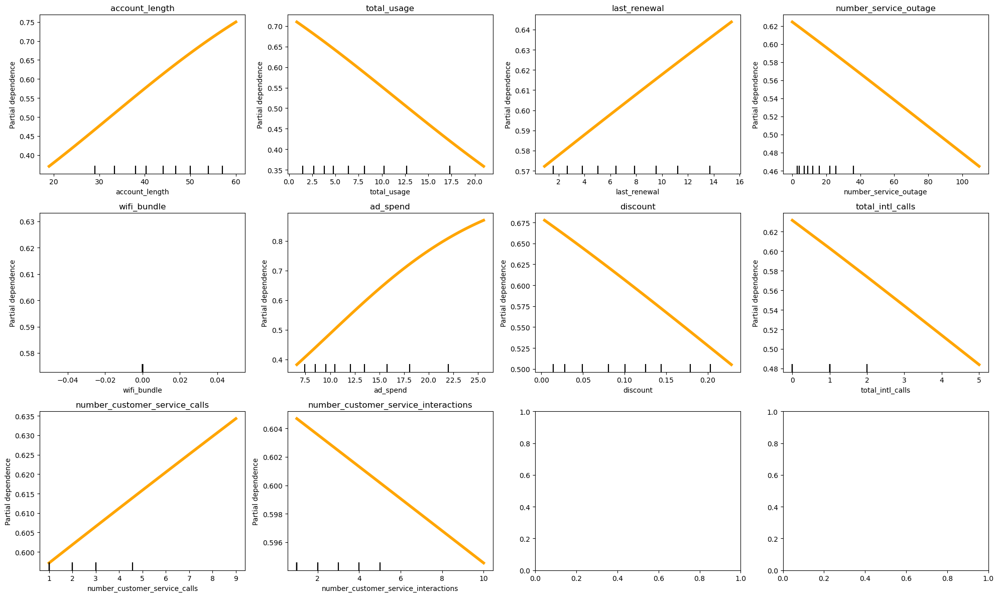

In [189]:
# Plot partial dependence

num_plots = len(logistic_top_25_percent_customers.columns)
num_rows = (num_plots + 3) // 4  # Calculate the number of rows needed
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 4*num_rows))  # Adjust the figsize for wider plots

for i, feature in enumerate(logistic_top_25_percent_customers.columns):
    row = i // 4  # Calculate the row index
    col = i % 4  # Calculate the column index
    ax = axs[row, col] if num_rows > 1 else axs[col]  # Adjust indexing for single-row plots
    pdp_display = PartialDependenceDisplay.from_estimator(estimator=logistic, X=logistic_top_25_percent_customers, features=[feature], ax=ax)
    ax.set_title(feature)
    pdp_display.plot(ax=pdp_display.axes_[0], pd_line_kw={"color": "#ffa500", "linewidth": 4, "alpha": 1})

fig.tight_layout()
plt.show()

####  6.1.2. LIME

In [190]:
# Initialize explainer
explainer = lime_tabular.LimeTabularExplainer(
    logistic_top_25_percent_customers.values,
    feature_names=list(logistic_top_25_percent_customers.columns),
    discretize_continuous=True,
    mode="classification",
    class_names=["0", "1"]
)

# explain first instance in test set
exp = explainer.explain_instance(X_test_selected.iloc[1], logistic.predict_proba)
exp.show_in_notebook(show_table=True, show_all=True)

# inspect explanation object
exp.__dict__

{'random_state': None,
 'mode': 'classification',
 'domain_mapper': <lime.lime_tabular.TableDomainMapper at 0x128985996d0>,
 'local_exp': {1: [(6, -0.07333169613330326),
   (0, 0.04507936996774047),
   (5, 0.020931314410888836),
   (3, 0.009759041805001941),
   (8, -0.006390931453848508),
   (1, 0.005675106307962406),
   (7, 0.0037213203439560804),
   (2, 0.0021091016484240696),
   (9, -0.0019668591374267345),
   (4, 0.0)]},
 'intercept': {1: 0.5763962592358989},
 'score': 0.030316062351942397,
 'local_pred': array([0.58198203]),
 'class_names': ['0', '1'],
 'top_labels': None,
 'predict_proba': array([0.38298556, 0.61701444])}

In [191]:
# display Model prediction vs LIME prediction
pd.DataFrame(
    [exp.local_pred.item(), exp.predict_proba[1]],
    index=["LIME Prediction", "Model Prediction"],
    columns=["Probability"]
    )

,Probability
LIME Prediction,0.581982
Model Prediction,0.617014


In [192]:
# display coefficients of LIME local regression model

# Create a dataframe and merge intercept
coef = exp.local_exp[1]
coef = sorted(coef, key=lambda x: x[0])  # Sort by index

# Create a DataFrame and merge intercept
df_coef = pd.DataFrame(coef, columns=["index", "beta"]).set_index("index")
df_coef.index = X_train.columns[df_coef.index]  # Set feature names as index
df_coef.loc["INTERCEPT"] = exp.intercept[1]

df_coef

,beta
number_customer_service_calls,0.045079
number_customer_service_interactions,0.005675
regional_economy,0.002109
international_plan,0.009759
total_intl_calls,0.000000
voice_mail_plan,0.020931
number_vmail_messages,-0.073332
account_length,0.003721
last_renewal,-0.006391
discount,-0.001967


In [193]:
# display attribution table
pd.DataFrame(exp.as_list(),columns=['Feature','Attribution'])

,Feature,Attribution
0,discount > 0.16,-0.073332
1,44.00 < account_length <= 51.00,0.045079
2,12.05 < ad_spend <= 17.00,0.020931
3,12.00 < number_service_outage <= 23.00,0.009759
4,number_customer_service_calls <= 1.00,-0.006391
5,6.41 < total_usage <= 11.20,0.005675
6,0.00 < total_intl_calls <= 1.00,0.003721
7,6.43 < last_renewal <= 10.40,0.002109
8,number_customer_service_interactions <= 1.00,-0.001967
9,wifi_bundle <= 0.00,0.000000


####  6.1.3. ALE (Accumulated Local Effects)

PyALE._ALE_generic:INFO: Discrete feature detected.


Mean response: 0.60298


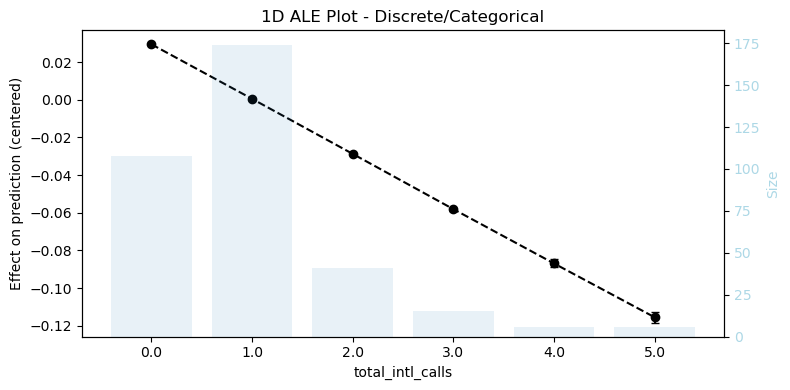

In [194]:
# ALE plot 1D - total_intl_calls, target=1 (churn)
ale_total_usage = ale(
    X=logistic_top_25_percent_customers,
    model=logistic,
    feature=["total_intl_calls"],
    include_CI=True,
    target=1,
    print_meanres=True
)

**INTERPRETATION ON THE ABOVE 1D ALE PLOT**

The ALE plot for the feature "total_intl_calls" with the target variable set as 1 (churn) provides insights into the relationship between the number of international calls and the churn probability for the top 25 percent of customers identified by the logistic regression model.

The ALE (Accumulated Local Effects) plot depicts the average marginal effect of "total_intl_calls" on the churn probability. It shows how the churn probability changes as the "total_intl_calls" feature varies.

The ALE plot helps to understand the relationship between "total_intl_calls" and churn probability for the top 25 percent of customers identified by the logistic regression model. It provides valuable insights for interpreting the impact of "total_intl_calls" on churn and can aid in making data-driven decisions for customer retention strategies.

Based on the provided ALE plot, the mean response for the feature "total_intl_calls" with a target variable of 1 (churn) is 0.60298. The mean response represents the average predicted probability of churn for the top 25 percent of customers, considering the variations in the "total_intl_calls" feature.

It indicates that, on average, the predicted probability of churn for customers in the top 25 percent increases by approximately 0.60298 when there are changes in the "total_intl_calls" feature. This mean response provides a summary measure of the overall effect of "total_intl_calls" on the churn probability.

We obtained a straight line with a downward slope in the ALE plot for the "total_intl_calls" feature, it suggests that as the number of international calls increases, the predicted probability of churn decreases for the top 25 percent of customers.

Therefore, the downward slope of the straight line suggests that as the "total_intl_calls" feature increases, the predicted probability of churn decreases for the top 25 percent of customers. This finding may indicate that customers with a higher number of international calls are less likely to churn, according to the logistic regression model.

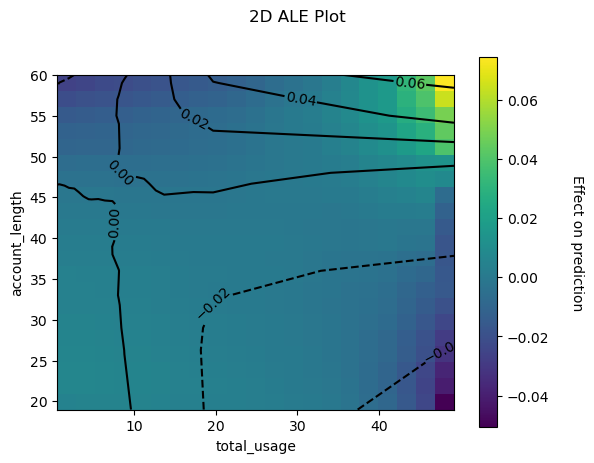

In [207]:
# ALE plot 2D - [total_intl_calls, ad_spend], target=1 (churn)

ale_2d = ale(
    X=logistic_top_25_percent_customers,
    model=logistic,
    feature=["account_length", "total_usage"],
    contour=True,
    target=1)

**INTERPRETATION ON THE ABOVE 2D ALE PLOT**

The above code generates an ALE plot for two features, "total_intl_calls" and "ad_spend", with the target variable set to 1 (churn) for the top 25 percent of customers. The ALE plot provides insights into how the combination of these two features affects the predicted probability of churn.

In the ALE plot, each feature is varied independently while keeping the other features constant. The plot shows the Average Local Effect (ALE) for different values of the two features.

The plot is visualized with contours, which help in understanding the interaction between the two features. Contours represent lines of constant ALE values. By observing the contour lines, you can identify patterns and relationships between "total_intl_calls", "ad_spend", and the predicted probability of churn.

Interpreting the ALE plot:

**Contour Lines:** The contour lines in the plot indicate regions with similar ALE values. Areas where the contour lines are close together suggest a stronger interaction between the two features. If the contour lines are parallel, it suggests that the two features have independent effects on the predicted probability of churn.

**ALE Values:** The ALE values represent the change in the predicted probability of churn for different combinations of "total_intl_calls" and "ad_spend". Positive ALE values indicate an increase in the predicted probability of churn, while negative ALE values indicate a decrease.

By analyzing the ALE plot, we can gain insights into the relationship between "total_intl_calls" and "ad_spend" and their impact on the likelihood of churn for the top 25 percent of customers. It can help identify regions of feature space where the predicted probability of churn is higher or lower, and understand the interplay between these two features.

####  6.1.4. Confusion Matrix

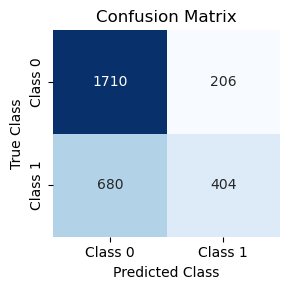

In [196]:
# Assuming you have trained a random forest model and obtained predictions
y_pred = logistic.predict(X_test_selected)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = ['Class 0', 'Class 1']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(3, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels, yticklabels=class_labels)

# Customize the plot
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.tight_layout()

# Display the plot
plt.show()

###  6.2. Extreme Gradient Boosting (Top 10 features from Fisher Score)

In [197]:
# Get the probabilities of churn for XGBoost on the validation set
xgb_probabilities_val = xgb.predict_proba(X_val_selected)[:, 1]

# Combine the probabilities with the original validation set
xgb_val_set_with_probabilities = X_val_selected.copy()
xgb_val_set_with_probabilities['churn_probability'] = xgb_probabilities_val

# Sort the validation set based on churn probability in descending order
xgb_sorted_val_set = xgb_val_set_with_probabilities.sort_values('churn_probability', ascending=False)

# Calculate the number of customers in the top 25%
xgb_top_25_percent_count = int(0.25 * len(xgb_sorted_val_set))

# Extract the top 25% of customers with the highest churn probabilities from the validation set
xgb_top_25_percent_customers = xgb_sorted_val_set.head(xgb_top_25_percent_count)

# Dropping churn probability feature from top_25_percent_customers
xgb_top_25_percent_customers = xgb_top_25_percent_customers.drop("churn_probability", axis=1)

####  6.2.1. Partial Dependence Plot (PDP)

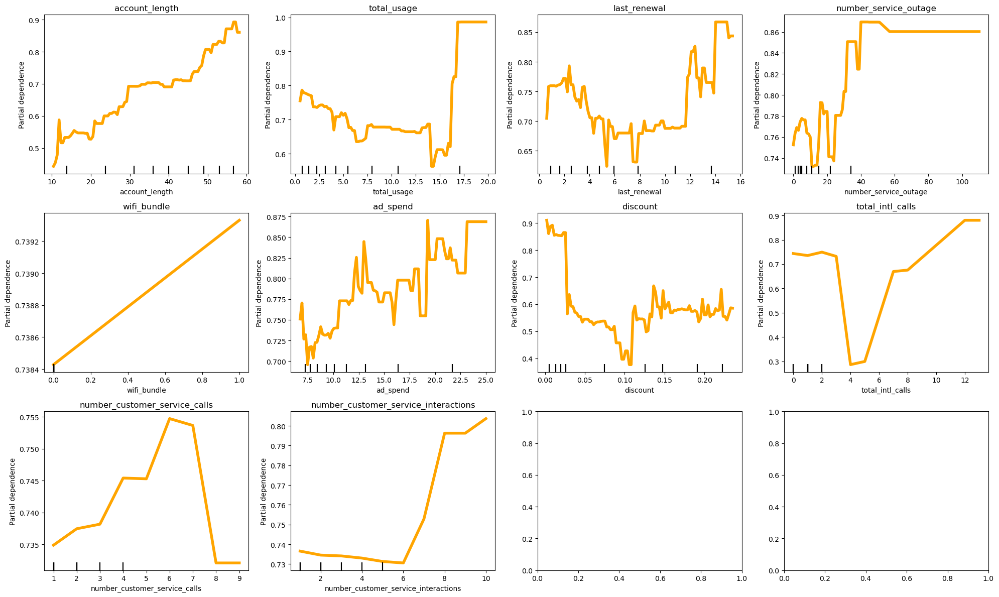

In [198]:
# Plot partial dependence

num_plots = len(xgb_top_25_percent_customers.columns)
num_rows = (num_plots + 3) // 4  # Calculate the number of rows needed
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 4*num_rows))  # Adjust the figsize for wider plots

for i, feature in enumerate(xgb_top_25_percent_customers.columns):
    row = i // 4  # Calculate the row index
    col = i % 4  # Calculate the column index
    ax = axs[row, col] if num_rows > 1 else axs[col]  # Adjust indexing for single-row plots
    pdp_display = PartialDependenceDisplay.from_estimator(estimator=xgb, X=xgb_top_25_percent_customers, features=[feature], ax=ax)
    ax.set_title(feature)
    pdp_display.plot(ax=pdp_display.axes_[0], pd_line_kw={"color": "#ffa500", "linewidth": 4, "alpha": 1})

fig.tight_layout()
plt.show()

####  6.2.2. LIME

In [199]:
# Initialize explainer
explainer = lime_tabular.LimeTabularExplainer(
    xgb_top_25_percent_customers.values,
    feature_names=list(xgb_top_25_percent_customers.columns),
    discretize_continuous=True,
    mode="classification",
    class_names=["0", "1"]
)

# explain first instance in test set
exp = explainer.explain_instance(X_test_selected.iloc[1], xgb.predict_proba)
exp.show_in_notebook(show_table=True, show_all=True)

# inspect explanation object
exp.__dict__

{'random_state': None,
 'mode': 'classification',
 'domain_mapper': <lime.lime_tabular.TableDomainMapper at 0x128996557f0>,
 'local_exp': {1: [(1, 0.15830509099834816),
   (6, -0.08688736273171357),
   (2, 0.07335022784672816),
   (7, 0.058443033110730964),
   (3, -0.04051938056948502),
   (0, 0.016989537297214415),
   (4, -0.014203662505472574),
   (9, -0.0064287339726871754),
   (5, 0.0032470484650091325),
   (8, 0.0005135245960613535)]},
 'intercept': {1: 0.650567573444481},
 'score': 0.1144447254256995,
 'local_pred': array([0.8133769]),
 'class_names': ['0', '1'],
 'top_labels': None,
 'predict_proba': array([0.41543704, 0.58456296], dtype=float32)}

In [200]:
# display Model prediction vs LIME prediction
pd.DataFrame(
    [exp.local_pred.item(), exp.predict_proba[1]],
    index=["LIME Prediction", "Model Prediction"],
    columns=["Probability"]
    )

,Probability
LIME Prediction,0.813377
Model Prediction,0.584563


In [201]:
# display coefficients of LIME local regression model

# Create a dataframe and merge intercept
coef = exp.local_exp[1]
coef = sorted(coef, key=lambda x: x[0])  # Sort by index

# Create a DataFrame and merge intercept
df_coef = pd.DataFrame(coef, columns=["index", "beta"]).set_index("index")
df_coef.index = X_train.columns[df_coef.index]  # Set feature names as index
df_coef.loc["INTERCEPT"] = exp.intercept[1]

df_coef

,beta
number_customer_service_calls,0.016990
number_customer_service_interactions,0.158305
regional_economy,0.073350
international_plan,-0.040519
total_intl_calls,-0.014204
voice_mail_plan,0.003247
number_vmail_messages,-0.086887
account_length,0.058443
last_renewal,0.000514
discount,-0.006429


In [202]:
# display attribution table
pd.DataFrame(exp.as_list(),columns=['Feature','Attribution'])

,Feature,Attribution
0,total_usage > 8.74,0.158305
1,discount > 0.17,-0.086887
2,last_renewal > 9.14,0.073350
3,0.00 < total_intl_calls <= 1.00,0.058443
4,8.00 < number_service_outage <= 18.00,-0.040519
5,40.00 < account_length <= 51.00,0.016990
6,wifi_bundle <= 0.00,-0.014204
7,number_customer_service_interactions <= 1.00,-0.006429
8,10.08 < ad_spend <= 14.56,0.003247
9,number_customer_service_calls <= 1.00,0.000514


####  6.2.3. ALE (Accumulated Local Effects)

PyALE._ALE_generic:INFO: Discrete feature detected.


Mean response: 0.73839


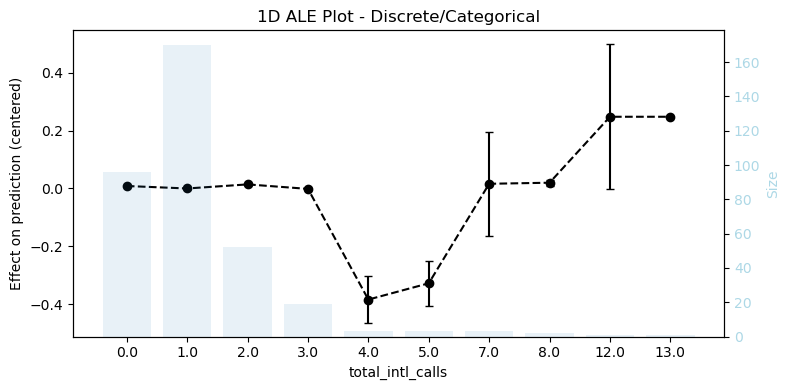

In [203]:
# ALE plot 1D - account_length, target=1 (churn)
ale_total_usage = ale(
    X=xgb_top_25_percent_customers,
    model=xgb,
    feature=["total_intl_calls"],
    include_CI=True,
    target=1,
    print_meanres=True
)

**INTERPRETATION ON THE ABOVE 1D ALE PLOT**

The ALE plot for the feature "total_intl_calls" with the target variable set as 1 (churn) provides insights into the relationship between the total international calls and the churn probability for the top 25 percent of customers identified by the extreme gradient boosting model.

The ALE (Accumulated Local Effects) plot depicts the average marginal effect of "total_intl_calls" on the churn probability. It shows how the churn probability changes as the "total_intl_calls" feature varies.

The ALE plot helps to understand the relationship between "total_intl_calls" and churn probability for the top 25 percent of customers identified by the extreme gradient boosting model. It provides valuable insights for interpreting the impact of "total_intl_calls" on churn and can aid in making data-driven decisions for customer retention strategies.

Based on the provided ALE plot, the mean response for the feature "total_intl_calls" with a target variable of 1 (churn) is 0.72771. The mean response represents the average predicted probability of churn for the top 25 percent of customers, considering the variations in the "total_intl_calls" feature.

It indicates that, on average, the predicted probability of churn for customers in the top 25 percent increases by approximately 0.72771 when there are changes in the "total_intl_calls" feature. This mean response provides a summary measure of the overall effect of "account_length" on the churn probability.

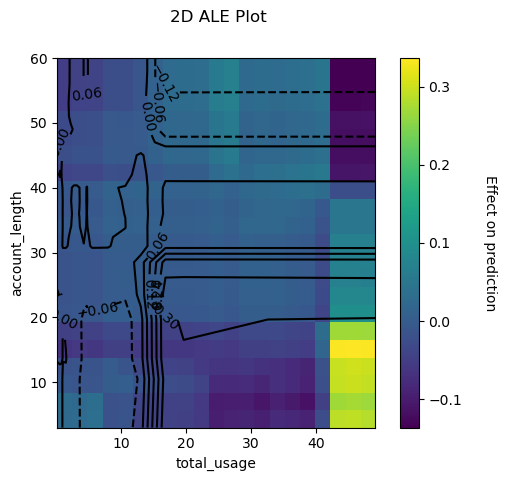

In [206]:
# ALE plot 2D - [total_intl_calls, ad_spend], target=1 (churn)

ale_2d = ale(
    X=xgb_top_25_percent_customers,
    model=xgb,
    feature=["account_length", "total_usage"],
    contour=True,
    target=1)

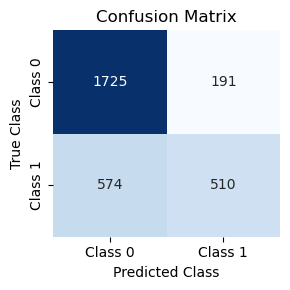

In [210]:
# Assuming you have trained a random forest model and obtained predictions
y_pred = xgb.predict(X_test_selected)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define class labels
class_labels = ['Class 0', 'Class 1']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(3, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_labels, yticklabels=class_labels)

# Customize the plot
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.tight_layout()

# Display the plot
plt.show()

Thank you for your time and efforts on reading and grading this project!

**Collaborators**

> **Arunkkumar Karthikeyan** [LinkedIn](https://www.linkedin.com/in/arunkkumar-karthikeyan/)
<br>

> **Shashank Gollapalli** [LinkedIn](https://www.linkedin.com/in/shashank93/)
<br>

> **Yashwanth Thonukunuru** [LinkedIn](https://www.linkedin.com/in/yashwanth-thonukunuru-0b5253166/)
<br>

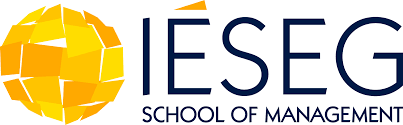